# TUIA Aprendizaje Automatico
## TP entrega 1

# Importacion


In [121]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, RidgeCV, ElasticNetCV, LassoCV


El dataset se llama weatherAUS.csv y contiene información climática de Australia de los
últimos diez años, incluyendo si para el día siguiente llovió o no y la cantidad de lluvia en las
columnas ‘RainTomorrow’ y ‘RainfallTomorrow’. El objetivo es la predicción de estas dos
variables en función del resto de las características que se consideren adecuadas.
Tiene una columna ‘Location’ que indica la ciudad y el objetivo es predecir la condición de
lluvia en las ciudades de Sydney, SydneyAirport, Canberra, Melbourne y MelbourneAirport
(costa sureste). Pueden considerarse como una única ubicación. Descartar el resto de los
datos.

In [122]:
# from google.colab import drive
# drive.mount('/content/drive')

In [123]:
### Carga datos de dataset
### Contiene aproximadamente 10 años de observaciones diarias de variables climáticas: temperatura, dirección y velocidad del viento, humedad, presión, nubosidad, y cantidad de lluvia en mm.
### tras observar los datos del día de hoy, el objetivo es predecir las variables target:
###                                                                                     -RainFallTomorrow: cantidad de lluvia del día posterior a la observación. Problema de Regresión.
###                                                                                     -RainTomorrow: si el día siguiente llueve o no llueve. Problema de Clasificación.
#file_path= '/content/drive/MyDrive/Colab Notebooks/tp automa/weatherAUS.csv'
#file_path = '/content/drive/MyDrive/TUIA/4 C/AA/weatherAUS.csv'
file_path= './weatherAUS.csv'#local
df_completo = pd.read_csv(file_path, sep=',',engine='python')



In [124]:
### Vista general de los  datos
df_completo.head()

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
0,0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,0.0
1,1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,0.0
2,2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,0.0
3,3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,1.0
4,4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,0.2


# Actividad 2

2. Realizar un análisis descriptivo, que ayude a la comprensión del problema, de cada
una de las variables involucradas en el problema detallando características,
comportamiento y rango de variación.
Debe incluir:
- Análisis y decisión sobre datos faltantes
- Visualización de datos (por ejemplo histogramas, scatterplots entre variables,
diagramas de caja)
- ¿Está balanceado el dataset?
- Codificación de variables categóricas (si se van a utilizar para predicción).
- Matriz de correlación
- Selección de características para la predicción.
- Estandarización de datos.

In [125]:
### Columnas, ¿cuáles son variables numéricas y cuales variables categóricas?

df_completo.columns

Index(['Unnamed: 0', 'Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall',
       'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am',
       'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow', 'RainfallTomorrow'],
      dtype='object')

In [126]:
df_completo.describe()

,Unnamed: 0,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainfallTomorrow
count,145412.000000,143928.000000,144159.000000,142152.000000,82658.000000,75616.000000,135159.000000,143645.000000,142351.000000,142759.000000,140907.000000,130351.000000,130388.000000,89542.000000,86076.000000,143646.000000,141805.000000,142153.000000
mean,72728.184393,12.195873,23.223176,2.361516,5.468616,7.611241,40.036564,14.044742,18.663164,68.877290,51.537432,1017.649277,1015.255184,4.447287,4.509770,16.992780,21.685249,2.361242
std,41990.722236,6.398018,7.118770,8.479338,4.193871,3.785612,13.607212,8.915610,8.810276,19.029576,20.796720,7.107132,7.037981,2.887161,2.720306,6.488045,6.936358,8.479084
min,0.000000,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000,0.000000
25%,36362.750000,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000,0.000000
50%,72727.500000,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000,0.000000
75%,109093.250000,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000,0.800000
max,145458.000000,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000,371.000000


Del describe y head detectamos algunos detalle, primero la columna Unnamed: 0 que actua como un segundo indice, y que ciertas columnas numericas tienen valores faltantes.
Seguimos clasificando las variables en numericas y categoricas

In [127]:
#Columnas catergóricas
#df_completo.dtypes
v_categoricas=df_completo.select_dtypes(include=['object', 'category']).columns.to_list()
v_categoricas

['Date',
 'Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [128]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145412 entries, 0 to 145411
Data columns (total 25 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        145412 non-null  int64  
 1   Date              145412 non-null  object 
 2   Location          145412 non-null  object 
 3   MinTemp           143928 non-null  float64
 4   MaxTemp           144159 non-null  float64
 5   Rainfall          142152 non-null  float64
 6   Evaporation       82658 non-null   float64
 7   Sunshine          75616 non-null   float64
 8   WindGustDir       135096 non-null  object 
 9   WindGustSpeed     135159 non-null  float64
 10  WindDir9am        134850 non-null  object 
 11  WindDir3pm        141186 non-null  object 
 12  WindSpeed9am      143645 non-null  float64
 13  WindSpeed3pm      142351 non-null  float64
 14  Humidity9am       142759 non-null  float64
 15  Humidity3pm       140907 non-null  float64
 16  Pressure9am       13

In [129]:
locaciones = df_completo['Location'].unique()
locaciones

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

Solo se analizaran los datos de los siguientes lugares:
- Sydney
- SydneyAirport
- Canberra
- Melbourne
- MelbourneAirport

In [130]:
df = df_completo[df_completo['Location'].isin(['Sydney', 'SydneyAirport', 'Melbourne', 'MelbourneAirport', 'Canberra'])]
df.head()
#df['Location'].unique()


,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
30167,30176,2008-02-01,Sydney,19.5,22.4,15.6,6.2,0.0,NaN,NaN,...,84.0,1017.6,1017.4,8.0,8.0,20.7,20.9,Yes,Yes,6.0
30168,30177,2008-02-02,Sydney,19.5,25.6,6.0,3.4,2.7,NaN,NaN,...,73.0,1017.9,1016.4,7.0,7.0,22.4,24.8,Yes,Yes,6.6
30169,30178,2008-02-03,Sydney,21.6,24.5,6.6,2.4,0.1,NaN,NaN,...,86.0,1016.7,1015.6,7.0,8.0,23.5,23.0,Yes,Yes,18.8
30170,30179,2008-02-04,Sydney,20.2,22.8,18.8,2.2,0.0,NaN,NaN,...,90.0,1014.2,1011.8,8.0,8.0,21.4,20.9,Yes,Yes,77.4
30171,30180,2008-02-05,Sydney,19.7,25.7,77.4,NaN,0.0,NaN,NaN,...,74.0,1008.3,1004.8,8.0,8.0,22.5,25.5,Yes,Yes,1.6


Chequeo de datos faltantes

In [131]:
# Datos faltantes por columna
df.isna().sum()

Unnamed: 0             0
Date                   0
Location               0
MinTemp              491
MaxTemp              486
Rainfall             787
Evaporation         1706
Sunshine            1948
WindGustDir         1457
WindGustSpeed       1455
WindDir9am           695
WindDir3pm           290
WindSpeed9am         261
WindSpeed3pm         249
Humidity9am          570
Humidity3pm          525
Pressure9am          735
Pressure3pm          726
Cloud9am            2677
Cloud3pm            2932
Temp9am              505
Temp3pm              496
RainToday            787
RainTomorrow         787
RainfallTomorrow     787
dtype: int64

In [132]:
df.describe()

,Unnamed: 0,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainfallTomorrow
count,15986.000000,15495.000000,15500.000000,15199.000000,14280.000000,14038.000000,14531.000000,15725.000000,15737.000000,15416.000000,15461.000000,15251.000000,15260.000000,13309.000000,13054.000000,15481.000000,15490.000000,15199.000000
mean,49512.619855,11.605221,21.751781,2.303744,4.866828,6.854694,44.417315,16.613672,21.797166,68.903023,51.280577,1018.305836,1016.064239,4.750545,4.746131,15.545953,20.229154,2.302586
std,15172.399796,5.851347,6.053679,7.385992,3.069869,3.842419,14.958027,10.336386,9.518033,15.614788,17.721335,7.400730,7.265386,2.728329,2.589879,5.559295,5.857956,7.385251
min,30176.000000,-8.000000,4.100000,0.000000,0.000000,0.000000,11.000000,0.000000,0.000000,11.000000,3.000000,986.700000,985.500000,0.000000,0.000000,-1.300000,3.700000,0.000000
25%,34173.250000,7.900000,17.100000,0.000000,2.600000,3.700000,33.000000,9.000000,15.000000,59.000000,39.000000,1013.400000,1011.200000,2.000000,2.000000,11.600000,15.900000,0.000000
50%,47228.500000,11.600000,21.300000,0.000000,4.200000,7.500000,43.000000,15.000000,20.000000,70.000000,51.000000,1018.500000,1016.300000,6.000000,6.000000,15.400000,19.800000,0.000000
75%,66393.750000,15.800000,25.800000,0.800000,6.600000,10.000000,54.000000,22.000000,28.000000,80.000000,62.000000,1023.300000,1021.000000,7.000000,7.000000,19.500000,24.100000,0.800000
max,70391.000000,30.500000,46.800000,119.400000,23.800000,13.900000,122.000000,69.000000,76.000000,100.000000,100.000000,1040.600000,1037.900000,9.000000,8.000000,37.200000,46.100000,119.400000


In [133]:
var = ['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall',
       'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am',
       'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow', 'RainfallTomorrow']

## Rellenar con moda
OBS: como una de las variables categoricas a rellenar es una de las dos variables a predecir se opto por eliminar los registros donde alguno de los campos RainTommorow y RainfallTomorrow sea NaN

In [134]:
#df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0], inplace=True)
#df['RainToday'].fillna(df['RainToday'].mode()[0], inplace=True)


##Eliminar datos faltantes de las variables a predecir

In [135]:
#Eliminar las filas donde 'rainfall' tiene NaN
df = df.dropna(subset=['RainTomorrow', 'RainfallTomorrow', 'RainToday'])


In [136]:
# Obtener la cantidad de NaN por cada columna.
df.isna().sum()


Unnamed: 0             0
Date                   0
Location               0
MinTemp                8
MaxTemp                5
Rainfall               0
Evaporation         1681
Sunshine            1931
WindGustDir         1436
WindGustSpeed       1434
WindDir9am           672
WindDir3pm           288
WindSpeed9am         260
WindSpeed3pm         249
Humidity9am           86
Humidity3pm           43
Pressure9am          252
Pressure3pm          244
Cloud9am            1900
Cloud3pm            2136
Temp9am               22
Temp3pm               14
RainToday              0
RainTomorrow           0
RainfallTomorrow       0
dtype: int64

In [137]:
df.columns

Index(['Unnamed: 0', 'Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall',
       'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am',
       'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow', 'RainfallTomorrow'],
      dtype='object')

In [138]:
# Eliminar la columnas Unnamed: 0
df.drop(['Unnamed: 0'], axis=1, inplace=True)

Rellenamos con la media de las variables numericas para la Location a la cual pertenecen

In [139]:
#
grupos = df.groupby('Location')

# Calcula la media para cada grupo.
medianas_por_grupo = grupos.transform('median')#Rellenar con la media o mediana

# Rellena los valores faltantes en cada grupo con la media correspondiente.
df = df.fillna(medianas_por_grupo)

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\1211672889.py:5: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [140]:
#Obtener la cantidad de NaN por cada columna.
df.isna().sum()


Date                   0
Location               0
MinTemp                0
MaxTemp                0
Rainfall               0
Evaporation            0
Sunshine               0
WindGustDir         1436
WindGustSpeed          0
WindDir9am           672
WindDir3pm           288
WindSpeed9am           0
WindSpeed3pm           0
Humidity9am            0
Humidity3pm            0
Pressure9am            0
Pressure3pm            0
Cloud9am               0
Cloud3pm               0
Temp9am                0
Temp3pm                0
RainToday              0
RainTomorrow           0
RainfallTomorrow       0
dtype: int64

Solo quedan valores faltantes en variables que no vamos a considerar

## Graficas variables numericas

In [141]:
import plotly.express as px
for v in var:
  if v not in v_categoricas:
    fig = px.box(df, x=v,color='Location')
    fig.show()

In [142]:
import plotly.express as px
for v in var:
  if v not in v_categoricas:
    fig = px.box(df, x=v)
    fig.show()

## Graficos variables categoricas

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\3754405177.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




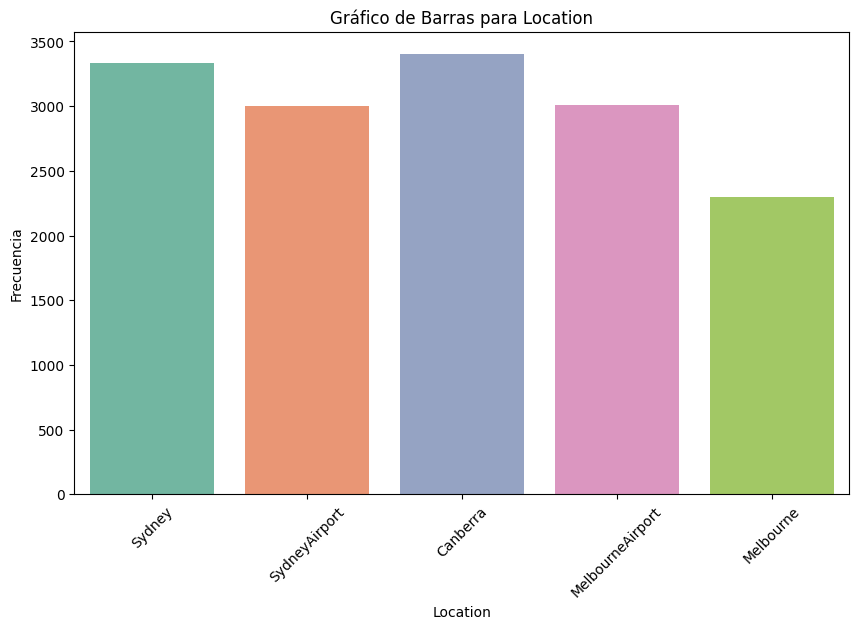

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\3754405177.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




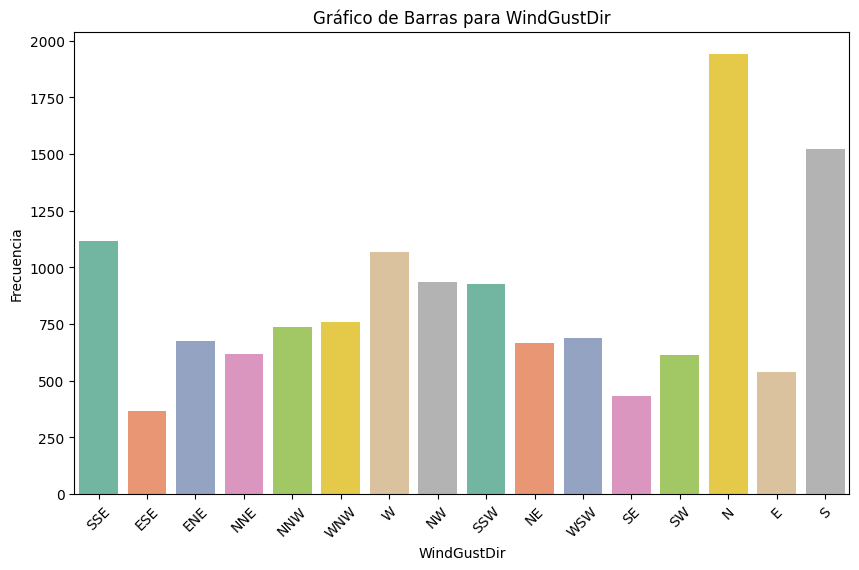

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\3754405177.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




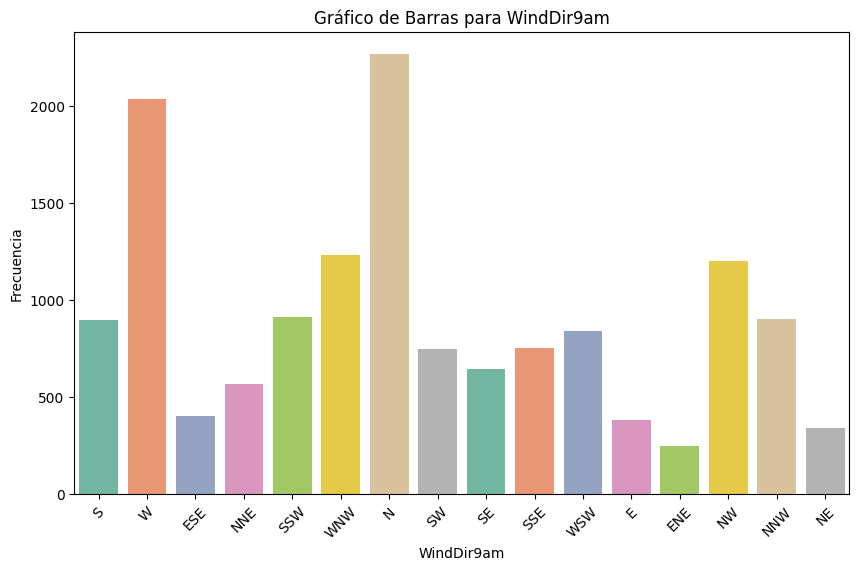

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\3754405177.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




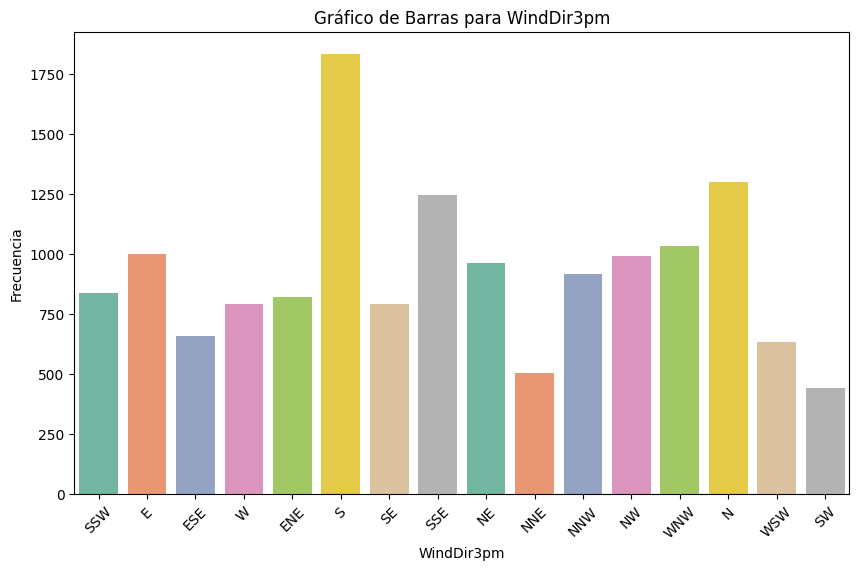

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\3754405177.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




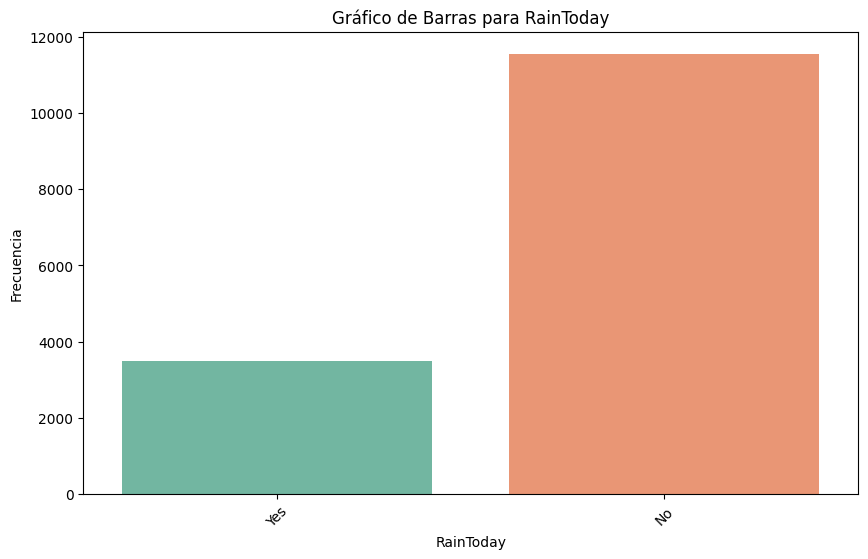

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\3754405177.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




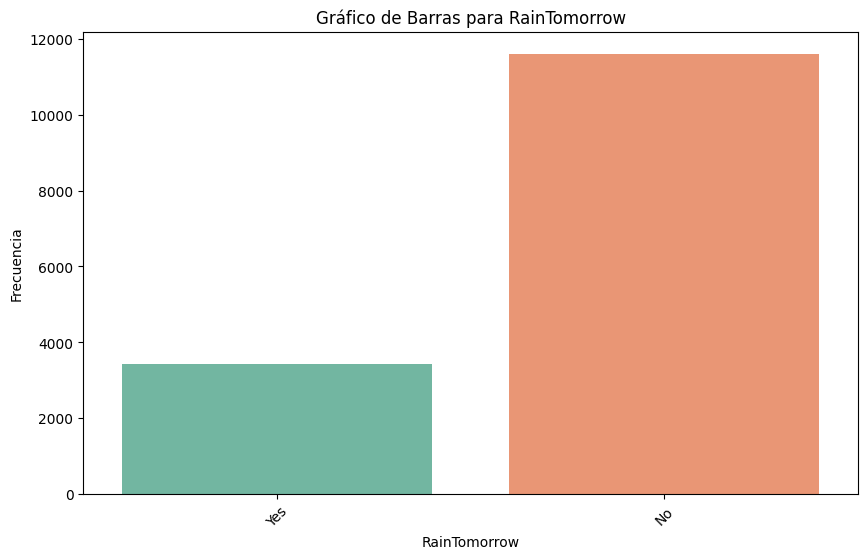

In [143]:
for columna in v_categoricas:
    if columna == 'Date': continue
    plt.figure(figsize=(10, 6))  # Ajusta el tamaño del gráfico si es necesario
    sns.countplot(data=df, x=columna, palette='Set2')  # Utiliza 'countplot' de Seaborn
    plt.title(f'Gráfico de Barras para {columna}')
    plt.xlabel(columna)
    plt.ylabel('Frecuencia')
    plt.xticks(rotation=45)  # Rota las etiquetas del eje x si es necesario
    plt.show()

Detectamos que el dataset esta desbalanceado en cuanto a la proporcion de registros de RainTomorrow y por lo tanto de RainfallTomorrow.


### Pair Plots
OBS: se dejan comentados por el tiempo que demoran en correr, se mantienen la salida

In [144]:
#sns.set(style="ticks")
#sns.pairplot(df, diag_kind="hist", corner=True, hue="RainTomorrow")
#plt.show()

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\2619127888.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



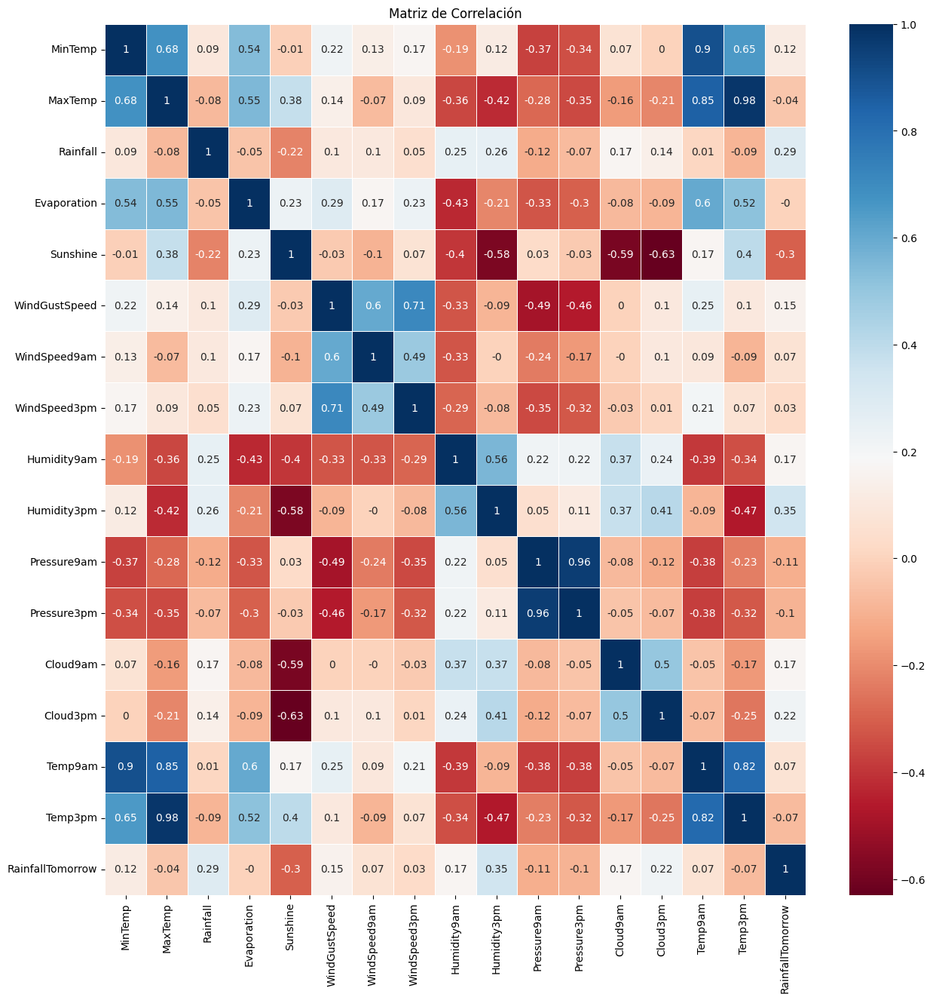

In [145]:
# Calcula la matriz de correlación
correlation_matrix = df.corr()

# Redondea los valores de la matriz a dos decimales
correlation_matrix = correlation_matrix.round(2)

# Crea una visualización de la matriz de correlación utilizando Seaborn
plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='RdBu', linewidths=.5)
plt.title('Matriz de Correlación')
plt.show()

De la matriz de correlacion  de las variables numericas observamos que para nuestra variable a predecir (RainfallTomorrow) no son fuertes las relaciones lineales con las demas variables, siendo el valor mas alto el de 0.35 con Humidity3pm

# Estandarizacion

In [146]:
columnas_numericas = df.select_dtypes(include=[np.number])
columnas_numericas.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainfallTomorrow'],
      dtype='object')

In [147]:
col_num = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainfallTomorrow']
# Crea un objeto StandardScaler
df_std = df.copy()
scaler = StandardScaler()
scaler.fit(df_std[col_num])
# Aplica la estandarización a las columnas seleccionadas
df_std[col_num] = scaler.fit_transform(df_std[col_num])
df_std.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainfallTomorrow
count,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04,1.503600e+04
mean,1.209756e-16,-5.746342e-16,7.560976e-18,7.560976e-17,-1.134146e-16,-1.890244e-17,-1.436585e-16,7.939025e-17,-4.385366e-16,1.587805e-16,5.670732e-15,3.282881e-15,9.073171e-17,-7.560976e-17,4.990244e-16,2.721951e-16,4.536586e-17
std,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00
min,-3.332292e+00,-2.922803e+00,-3.105734e-01,-1.632500e+00,-1.957332e+00,-2.310986e+00,-1.591532e+00,-2.294257e+00,-3.708602e+00,-2.720223e+00,-4.312413e+00,-4.243568e+00,-1.883909e+00,-1.970358e+00,-3.031946e+00,-2.829236e+00,-3.074595e-01
25%,-6.306723e-01,-7.600374e-01,-3.105734e-01,-6.692362e-01,-7.076669e-01,-6.280270e-01,-7.126865e-01,-7.074013e-01,-6.340377e-01,-6.900921e-01,-6.468783e-01,-6.631325e-01,-1.111482e+00,-7.280262e-01,-7.157637e-01,-7.299794e-01,-3.074595e-01
50%,-1.993395e-03,-8.314124e-02,-3.105734e-01,-2.564087e-01,2.642946e-01,-2.072872e-01,-1.267897e-01,-1.784492e-01,7.054992e-02,-1.338179e-02,3.444784e-02,2.995086e-03,4.333731e-01,1.001952e-01,-1.552247e-02,-8.142866e-02,-3.074595e-01
75%,7.286334e-01,6.597936e-01,-2.025291e-01,5.692462e-01,7.363902e-01,5.640691e-01,5.567565e-01,6.678741e-01,7.110841e-01,6.069360e-01,6.612679e-01,6.691227e-01,8.195868e-01,9.284166e-01,7.206286e-01,6.695248e-01,-1.981509e-01
max,3.209366e+00,4.126823e+00,1.581504e+01,6.555244e+00,1.902744e+00,5.472700e+00,5.146281e+00,5.745814e+00,1.992152e+00,2.749852e+00,3.032283e+00,3.028325e+00,1.592014e+00,1.342527e+00,3.880692e+00,4.407225e+00,1.600685e+01


### Codificamos Rainfall tomorrow y today como binaria y las direcciones de viento con one hot

In [148]:
df_codificado=df_std.copy()

In [149]:
# df_sub = df.drop(['label'], axis=1) # Dropear las categoricas o encodearlas
#df_std = (df_sub-df_sub.mean())/df_sub.std() # Estandarizar

In [150]:
#One hot
#df_codificado = pd.get_dummies(df, columns=['WindGustDir', 'WindDir9am', 'WindDir3pm'])
#GENERA DEMASIADASS COLUMNAS Y POCA INFO(probamos matriz de correlacion para fundamentar esto)
df_codificado = df_std.copy()
#Binaria
df_codificado['RainToday'] = df_codificado['RainToday'].map({'No': 0, 'Yes': 1})
df_codificado['RainTomorrow'] = df_codificado['RainTomorrow'].map({'No': 0, 'Yes': 1})

df_codificado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15036 entries, 30167 to 70370
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              15036 non-null  object 
 1   Location          15036 non-null  object 
 2   MinTemp           15036 non-null  float64
 3   MaxTemp           15036 non-null  float64
 4   Rainfall          15036 non-null  float64
 5   Evaporation       15036 non-null  float64
 6   Sunshine          15036 non-null  float64
 7   WindGustDir       13600 non-null  object 
 8   WindGustSpeed     15036 non-null  float64
 9   WindDir9am        14364 non-null  object 
 10  WindDir3pm        14748 non-null  object 
 11  WindSpeed9am      15036 non-null  float64
 12  WindSpeed3pm      15036 non-null  float64
 13  Humidity9am       15036 non-null  float64
 14  Humidity3pm       15036 non-null  float64
 15  Pressure9am       15036 non-null  float64
 16  Pressure3pm       15036 non-null  fl

# Actividad 3


3. Implementar la solución del problema de regresión con regresión lineal múltiple.
- Probar con el método LinearRegression.
- Probar con métodos de gradiente descendiente.
- Probar con métodos de regularización (Lasso, Ridge, Elasticnet).
- Obtener las métricas adecuadas (entre R2 Score, MSE, RMSE, MAE,
MAPE).

Variables a Predecir:
- ‘RainTomorrow’  
- ‘RainfallTomorrow’

Los codigos que hay que adaptar estan en la carpeta de regresion lineal

OBS: Se convirtio el campo Date en Año,Mes,Dia y Dia de la Semana pero se opto por no incluirlo en esta entrega. Se deja el codigo por si resulta util mas adelante

In [151]:
# Convertir la columna 'Date' a tipo datetime
#df_codificado['Date'] = pd.to_datetime(df_codificado['Date'])

# Extraer características de la fecha
#df_codificado['Year'] = df_codificado['Date'].dt.year
#df_codificado['Month'] = df_codificado['Date'].dt.month
# df_codificado['Day'] = df_codificado['Date'].dt.day
#df_codificado['DayOfWeek'] = df_codificado['Date'].dt.dayofweek  # 0: Lunes, 1: Martes, ..., 6: Domingo

# Ahora, puedes utilizar estas características en tu modelo de regresión
# por ejemplo, como parte de las variables independientes (X).


In [152]:
df_codificado.drop(['Date'], axis=1, inplace=True)


In [153]:
#df_codificado.columns


In [154]:
#df_codificado.info()

# Modelo por ciudad o general

In [155]:
#GENERAL
#df_codificado = df_codificado.copy()
#df_codificado_general = (df_codificado1-df_codificado1.mean())/df_codificado1.std() # Estandarizar
df_codificado_general = df_codificado.copy()

df_codificado_general.drop(['Location', 'WindDir9am', 'WindDir3pm','WindGustDir'], axis=1, inplace=True)

In [156]:
df_codificado_general.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow', 'RainfallTomorrow'],
      dtype='object')

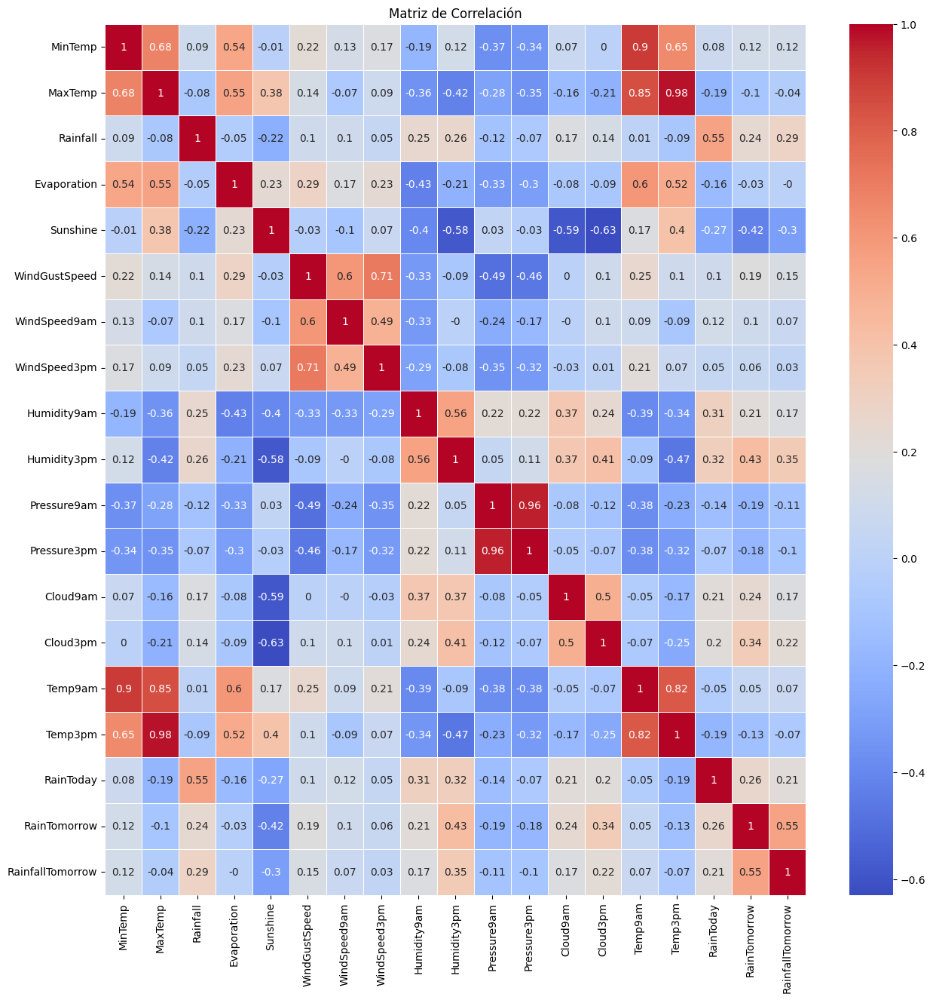

In [157]:
correlation_matrix2 = df_codificado_general.corr()

# Redondea los valores de la matriz a dos decimales
correlation_matrix2 = correlation_matrix2.round(2)

# Crea una visualización de la matriz de correlación utilizando Seaborn
plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix2, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Matriz de Correlación')
plt.show()

# Modelos para Rainfalltomorrow

## Regresion Lineal Multiple

In [158]:

# Seleccionar características (variables independientes)
# Aquí, selecciona todas las columnas excepto 'RainTomorrow' y 'RainfallTomorrow'
features = df_codificado_general.drop(['RainfallTomorrow'] , axis=1)

# Variables objetivo
target_rain_tomorrow = df_codificado_general['RainTomorrow']
target_rainfall_tomorrow = df_codificado_general['RainfallTomorrow']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    features, target_rainfall_tomorrow, test_size=0.2, random_state=42)

# Modelo de regresión lineal para 'RainfallTomorrow'
lr_rainfall_tomorrow = LinearRegression()
lr_rainfall_tomorrow.fit(X_train, y_train)
y_pred_rainfall_tomorrow = lr_rainfall_tomorrow.predict(X_test)

# Evaluar el modelo para 'RainfallTomorrow'
r2_rainfall_tomorrow = r2_score(y_test, y_pred_rainfall_tomorrow)
mse_rainfall_tomorrow = mean_squared_error(y_test, y_pred_rainfall_tomorrow)
rmse_rainfall_tomorrow = mean_squared_error(y_test, y_pred_rainfall_tomorrow, squared=False)
mae_rainfall_tomorrow = mean_absolute_error(y_test, y_pred_rainfall_tomorrow)
mape_rainfall_tomorrow = (mae_rainfall_tomorrow / np.mean(y_test)) * 100

r2_rainfall_tomorrow_Train = r2_score(y_train,lr_rainfall_tomorrow.predict(X_train))
# Imprimir métricas para 'RainfallTomorrow'
print("\nMétricas para RainfallTomorrow:")
print("R2 Score:", r2_rainfall_tomorrow.round(4))
print("Mean Squared Error:", mse_rainfall_tomorrow.round(4))
print("Root Mean Squared Error:", rmse_rainfall_tomorrow.round(4))
print("Mean Absolute Error:", mae_rainfall_tomorrow.round(4))
print("MAPE:", mape_rainfall_tomorrow.round(4))
print('R² adj: ',(1-((1-lr_rainfall_tomorrow.score(X_test, y_test))*((len(X_test)-1)))/(len(X_test)-(len(X_test.columns)-1))).round(4))#Como se comparan modelos con distinta cantidad de features tambien incluimos R2 ajustado
print("R2 Score Train:", r2_rainfall_tomorrow_Train.round(4))


Métricas para RainfallTomorrow:
R2 Score: 0.3377
Mean Squared Error: 0.8477
Root Mean Squared Error: 0.9207
Mean Absolute Error: 0.3567
MAPE: 837.0193
R² adj:  0.3342
R2 Score Train: 0.3553


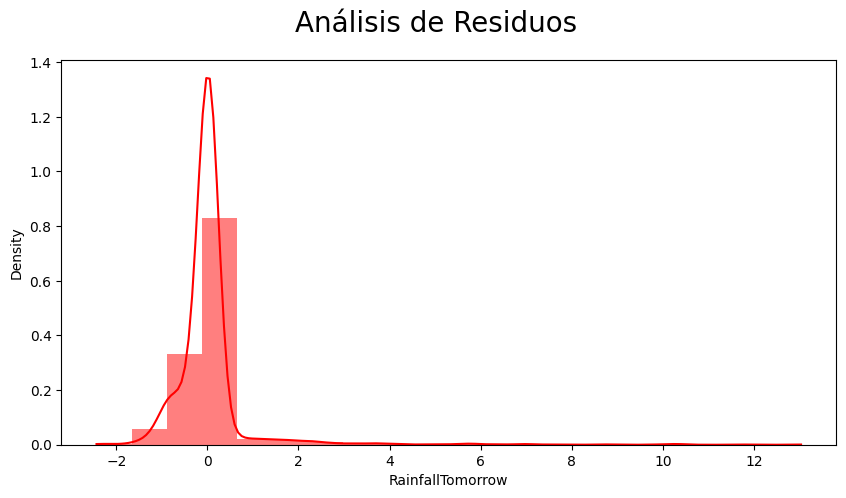

In [159]:
fig = plt.figure(figsize=(10,5))

sns.histplot((y_test - y_pred_rainfall_tomorrow), color="red", kde=True, stat="density", linewidth=0,bins=20)
fig.suptitle('Análisis de Residuos', fontsize = 20)
plt.show()

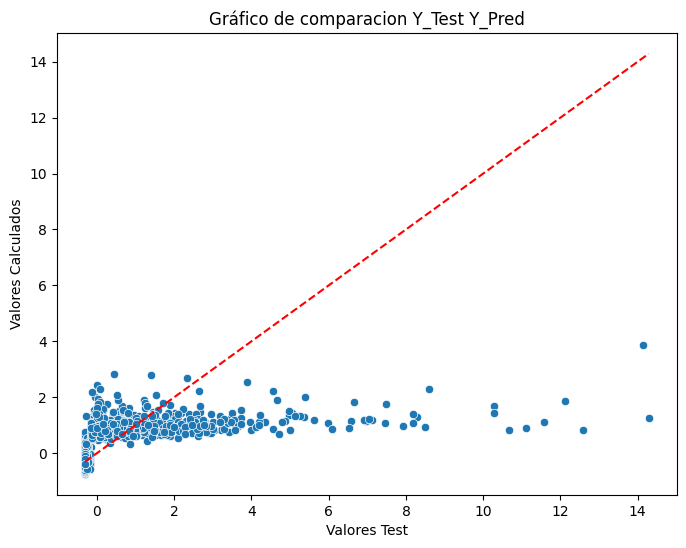

In [160]:
residuos = y_test -y_pred_rainfall_tomorrow

# Crea un gráfico de dispersión de residuos utilizando Seaborn
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred_rainfall_tomorrow)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # Línea diagonal de referencia
plt.title('Gráfico de comparacion Y_Test Y_Pred')
plt.xlabel('Valores Test')
plt.ylabel('Valores Calculados')
plt.show()

## Descenso por Gradiente

In [161]:

features = df_codificado_general.drop(['RainfallTomorrow'] , axis=1)

# Variables objetivo
target_rain_tomorrow = df_codificado_general['RainTomorrow']
target_rainfall_tomorrow = df_codificado_general['RainfallTomorrow']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    features, target_rainfall_tomorrow, test_size=0.2, random_state=42)


# Crear un modelo de regresión lineal con SGD
model_sgd = SGDRegressor()

# Entrenar el modelo en el conjunto de entrenamiento
model_sgd.fit(X_train, y_train)

# Hacer predicciones en el conjunto de prueba
y_pred_sgd = model_sgd.predict(X_test)

# Evaluar el modelo
r2_sgd_rainfall_tomorrow = r2_score(y_test, y_pred_sgd)
mse_sgd_rainfall_tomorrow = mean_squared_error(y_test, y_pred_sgd)
rmse_sgd_rainfall_tomorrow = mean_squared_error(y_test, y_pred_sgd, squared=False)
mae_sgd_rainfall_tomorrow = mean_absolute_error(y_test, y_pred_sgd)

r2_sgd_rainfall_tomorrow_train = r2_score(y_train,model_sgd.predict(X_train))

# Imprimir métricas para 'RainfallTomorrow'
print("\nMétricas para RainfallTomorrow:")
print("R2 Score:", r2_sgd_rainfall_tomorrow.round(4))
print("Mean Squared Error:", mse_sgd_rainfall_tomorrow.round(4))
print("Root Mean Squared Error:", rmse_sgd_rainfall_tomorrow.round(4))
print("Mean Absolute Error:", mae_sgd_rainfall_tomorrow.round(4))
print('R² adj: ',(1-((1-model_sgd.score(X_test, y_test))*((len(X_test)-1)))/(len(X_test)-(len(X_test.columns)-1))).round(4))
print("R2 Score Train:", r2_sgd_rainfall_tomorrow_train.round(4))


Métricas para RainfallTomorrow:
R2 Score: 0.3355
Mean Squared Error: 0.8505
Root Mean Squared Error: 0.9222
Mean Absolute Error: 0.3519
R² adj:  0.3319
R2 Score Train: 0.3545


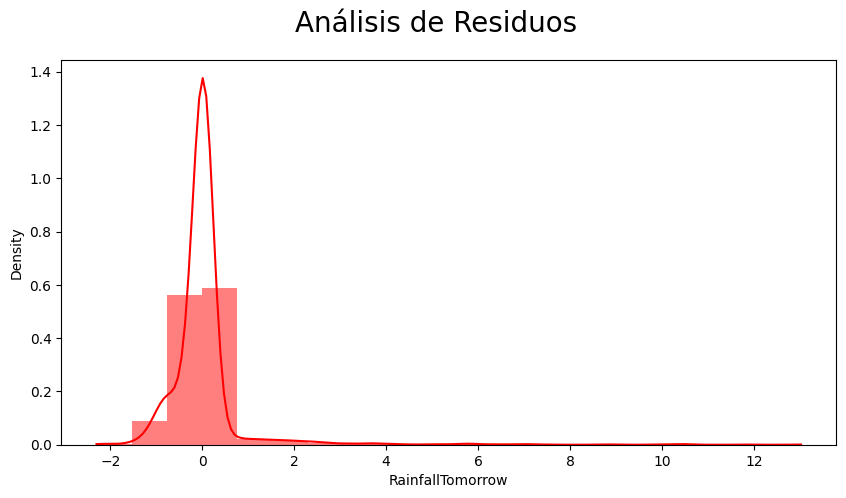

In [162]:
fig = plt.figure(figsize=(10,5))

sns.histplot((y_test - y_pred_sgd), color="red", kde=True, stat="density", linewidth=0,bins=20)
fig.suptitle('Análisis de Residuos', fontsize = 20)
plt.show()

## Ridge, Lasso y ElasticNet

In [163]:
features = df_codificado_general.drop(['RainfallTomorrow'] , axis=1)
#cols =['RainTomorrow','Humidity3pm','MaxTemp','Evaporation','RainToday','Sunshine','WindGustSpeed']
#features = df_codificado_general[cols]
# Variables objetivo
target_rain_tomorrow = df_codificado_general['RainTomorrow']
target_rainfall_tomorrow = df_codificado_general['RainfallTomorrow']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    features, target_rainfall_tomorrow, test_size=0.2, random_state=42)

lr = LinearRegression()
lasso = Lasso(alpha=0.01) # alpha controla la fuerza de la regularización L1 (Lasso)
ridge = Ridge(alpha=0.01)  # alpha controla la fuerza de la regularización L2 (Ridge)
elasticnet = ElasticNet(alpha=0.1, l1_ratio=0.5)

# Ajustar modelos a los datos
lr.fit(X_train, y_train)
lasso.fit(X_train, y_train)
ridge.fit(X_train, y_train)
elasticnet.fit(X_train,y_train)

# Mostrar coeficientes
print("Coeficientes del modelo de regresión lineal:")
print(lr.coef_)
print(lr.score(X_train,y_train).round(4))

print("\nCoeficientes del modelo Lasso:")
print(lasso.coef_)
print(lasso.score(X_train,y_train).round(4))


print("\nCoeficientes del modelo Ridge:")
print(ridge.coef_)
print(ridge.score(X_train,y_train).round(4))


print("\nCoeficientes del modelo ElasticNet:")
print(elasticnet.coef_)
print(elasticnet.score(X_train,y_train).round(4))

Coeficientes del modelo de regresión lineal:
[-0.04504412  0.02554667  0.16208855  0.01132288 -0.05740263  0.11277492
 -0.013845   -0.04983321 -0.02680966  0.19168064  0.17686562 -0.14915288
 -0.01196569 -0.01935736  0.0037673   0.07356477 -0.05133325  0.99213628]
0.3553

Coeficientes del modelo Lasso:
[-0.          0.04127509  0.13767155  0.         -0.02852986  0.06854791
 -0.00156312 -0.02244467 -0.          0.13909328  0.0150796  -0.
 -0.         -0.          0.          0.02057384 -0.          0.95844241]
0.3491

Coeficientes del modelo Ridge:
[-0.04504447  0.02554786  0.16208844  0.01132271 -0.05740326  0.11277515
 -0.01384511 -0.04983321 -0.02680928  0.1916809   0.17686219 -0.14914987
 -0.01196586 -0.01935716  0.00376764  0.07356391 -0.05133271  0.99213006]
0.3553

Coeficientes del modelo ElasticNet:
[ 0.          0.          0.1230528   0.         -0.04192777  0.0396049
  0.         -0.          0.          0.13346356 -0.         -0.
  0.          0.          0.01232112  0.    

In [164]:
features = df_codificado_general.drop(['RainfallTomorrow'] , axis=1)
#cols =['RainTomorrow','Humidity3pm','MaxTemp','Evaporation','RainToday','Sunshine','WindGustSpeed']
#features = df_codificado_general[cols]
# Variables objetivo
target_rain_tomorrow = df_codificado_general['RainTomorrow']
target_rainfall_tomorrow = df_codificado_general['RainfallTomorrow']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    features, target_rainfall_tomorrow, test_size=0.2, random_state=42)

lassoCV = LassoCV()  # alpha controla la fuerza de la regularización L1 (Lasso)
ridgeCV = RidgeCV()  # alpha controla la fuerza de la regularización L2 (Ridge)
elasticnetCV = ElasticNetCV()

# Ajustar modelos a los datos
lassoCV.fit(X_train, y_train)
ridgeCV.fit(X_train, y_train)
elasticnetCV.fit(X_train,y_train)



y_pred_lasso = lassoCV.predict(X_test)
y_pred_ridge = ridgeCV.predict(X_test)
y_pred_elasticnet = elasticnetCV.predict(X_test)


print("Alphas")
print(lassoCV.alpha_)
print(ridgeCV.alpha_)
print(elasticnetCV.alpha_ )

#Lasso
r2_lasso = r2_score(y_test, y_pred_lasso)
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
rmse_lasso = mean_squared_error(y_test, y_pred_lasso, squared=False)
mae_lasso = mean_absolute_error(y_test, y_pred_lasso)
r2_lasso_train = r2_score(y_train,lassoCV.predict(X_train))

# Imprimir métricas para 'RainfallTomorrow'
print("\nMétricas para RainfallTomorrow Lasso:")
print("R2 Score:", r2_lasso.round(4))
print("Mean Squared Error:", mse_lasso.round(4))
print("Root Mean Squared Error:", rmse_lasso.round(4))
print("Mean Absolute Error:", mae_lasso.round(4))
print('R² adj: ',(1-((1-lassoCV.score(X_test, y_test))*((len(X_test)-1)))/(len(X_test)-(len(X_test.columns)-1))).round(4))
print("R2 Score Train:", r2_lasso_train.round(4))


r2_ridge = r2_score(y_test, y_pred_ridge)
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
rmse_ridge = mean_squared_error(y_test, y_pred_ridge, squared=False)
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)
r2_ridge_train = r2_score(y_train,ridgeCV.predict(X_train))

# Imprimir métricas para 'RainfallTomorrow'
print("\nMétricas para RainfallTomorrow Ridge:")
print("R2 Score:", r2_ridge.round(4))
print("Mean Squared Error:", mse_ridge.round(4))
print("Root Mean Squared Error:", rmse_ridge.round(4))
print("Mean Absolute Error:", mae_ridge.round(4))
print('R² adj: ',(1-((1-ridgeCV.score(X_test, y_test))*((len(X_test)-1)))/(len(X_test)-(len(X_test.columns)-1))).round(4))
print("R2 Score Train:", r2_ridge_train.round(4))



r2_elastic = r2_score(y_test, y_pred_elasticnet)
mse_elastic = mean_squared_error(y_test, y_pred_elasticnet)
rmse_elastic = mean_squared_error(y_test, y_pred_elasticnet, squared=False)
mae_elastic = mean_absolute_error(y_test, y_pred_elasticnet)
r2_ridge_elastic = r2_score(y_train,elasticnetCV.predict(X_train))


# Imprimir métricas para 'RainfallTomorrow'
print("\nMétricas para RainfallTomorrow ElasticNet:")
print("R2 Score:", r2_elastic.round(4))
print("Mean Squared Error:", mse_elastic.round(4))
print("Root Mean Squared Error:", rmse_elastic.round(4))
print("Mean Absolute Error:", mae_elastic.round(4))
print('R² adj: ',(1-((1-elasticnetCV.score(X_test, y_test))*((len(X_test)-1)))/(len(X_test)-(len(X_test.columns)-1))).round(4))
print("R2 Score Train:", r2_ridge_elastic.round(4))



# Mostrar coeficientes

print("\nCoeficientes del modelo Lasso:")
print(f"Coeficientes: {lassoCV.coef_}")
print(f"Score:  {lassoCV.score(X_train,y_train).round(4)}")


print("\nCoeficientes del modelo Ridge:")
print(f"Coeficientes:{ridgeCV.coef_}")
print(f"Score:  {ridgeCV.score(X_train,y_train).round(4)}")


print("\nCoeficientes del modelo ElasticNet:")
print(f"Coeficientes:{elasticnetCV.coef_}")
print(f"Score: {elasticnetCV.score(X_train,y_train).round(4)}")



Alphas
0.0003382199035726077
10.0
0.0006764398071452154

Métricas para RainfallTomorrow Lasso:
R2 Score: 0.3375
Mean Squared Error: 0.848
Root Mean Squared Error: 0.9209
Mean Absolute Error: 0.356
R² adj:  0.3339
R2 Score Train: 0.3553

Métricas para RainfallTomorrow Ridge:
R2 Score: 0.3375
Mean Squared Error: 0.8479
Root Mean Squared Error: 0.9208
Mean Absolute Error: 0.3565
R² adj:  0.334
R2 Score Train: 0.3553

Métricas para RainfallTomorrow ElasticNet:
R2 Score: 0.3374
Mean Squared Error: 0.8481
Root Mean Squared Error: 0.9209
Mean Absolute Error: 0.3559
R² adj:  0.3339
R2 Score Train: 0.3553

Coeficientes del modelo Lasso:
Coeficientes: [-0.04103888  0.0269569   0.16115969  0.01035859 -0.05605958  0.11146881
 -0.01371537 -0.04871779 -0.02618085  0.18996094  0.16805784 -0.14061112
 -0.01168127 -0.01820087  0.          0.07273008 -0.04984204  0.99131955]
Score:  0.3553

Coeficientes del modelo Ridge:
Coeficientes:[-0.04538104  0.02670279  0.16198236  0.01116343 -0.05802429  0.113003

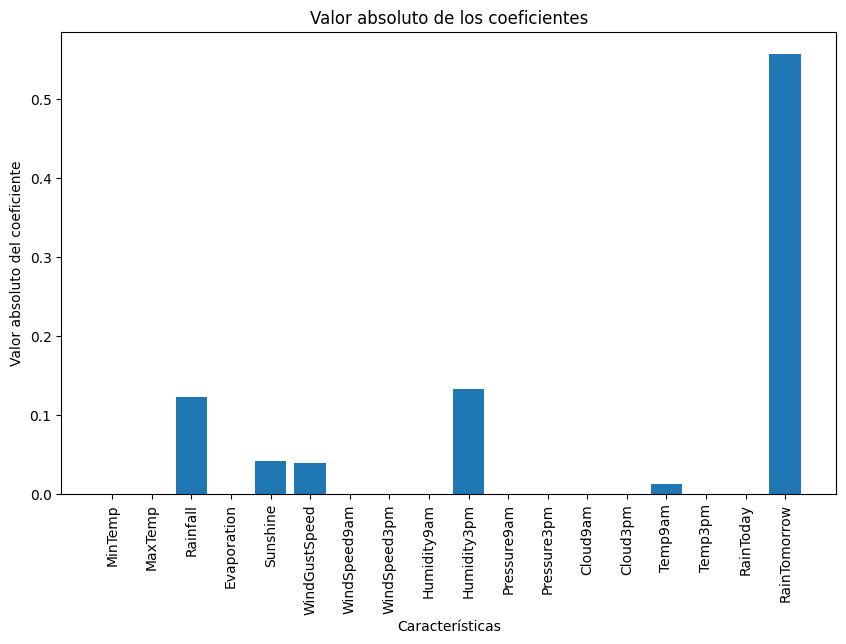

In [165]:
coeficientes = elasticnet.coef_

# Nombres de las características correspondientes
nombres_caracteristicas = features.columns

#gráfico de barras para visualizar los coeficientes
plt.figure(figsize=(10, 6))
plt.bar(range(len(coeficientes)), np.abs(coeficientes))
plt.xticks(range(len(coeficientes)), nombres_caracteristicas, rotation=90)
plt.xlabel("Características")
plt.ylabel("Valor absoluto del coeficiente")
plt.title("Valor absoluto de los coeficientes")
plt.show()

In [166]:
mejores_coef = ['WindGustSpeed','Temp9am', 'Sunshine','Rainfall','RainTomorrow']

In [167]:
#features = df_codificado_general.drop(['RainfallTomorrow'] , axis=1)
#cols =['RainTomorrow','Humidity3pm','MaxTemp','Evaporation','RainToday','Sunshine','WindGustSpeed']
features2 = df_codificado_general[mejores_coef]
# Variables objetivo
target_rain_tomorrow = df_codificado_general['RainTomorrow']
target_rainfall_tomorrow = df_codificado_general['RainfallTomorrow']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    features2, target_rainfall_tomorrow, test_size=0.2, random_state=42)

lassoCV = LassoCV()  # alpha controla la fuerza de la regularización L1 (Lasso)
ridgeCV = RidgeCV()  # alpha controla la fuerza de la regularización L2 (Ridge)
elasticnetCV = ElasticNetCV()

# Ajustar modelos a los datos
lassoCV.fit(X_train, y_train)
ridgeCV.fit(X_train, y_train)
elasticnetCV.fit(X_train,y_train)

print("Alphas")
print(lassoCV.alpha_)
print(ridgeCV.alpha_)
print(elasticnetCV.alpha_ )

# Mostrar coeficientes

print("\nCoeficientes del modelo Lasso:")
print(f"Coeficientes: {lassoCV.coef_}")
print(f"Score:  {lassoCV.score(X_train,y_train).round(4)}")


print("\nCoeficientes del modelo Ridge:")
print(f"Coeficientes:{ridgeCV.coef_}")
print(f"Score:  {ridgeCV.score(X_train,y_train).round(4)}")


print("\nCoeficientes del modelo ElasticNet:")
print(f"Coeficientes:{elasticnetCV.coef_}")
print(f"Score: {elasticnetCV.score(X_train,y_train).round(4)}")


Alphas
0.00029265972199802237
1.0
0.0005853194439960447

Coeficientes del modelo Lasso:
Coeficientes: [ 0.0242555   0.05034806 -0.08074664  0.15625368  1.07985943]
Score:  0.3373

Coeficientes del modelo Ridge:
Coeficientes:[ 0.02439668  0.05061774 -0.08090111  0.15640872  1.08068487]
Score:  0.3373

Coeficientes del modelo ElasticNet:
Coeficientes:[ 0.02440037  0.0504007  -0.08109878  0.15633606  1.07759863]
Score: 0.3373


In [168]:
metricas_modelo_regresion_lineal = {
    'r2': 0.3377,
    'r2ajustado':0.3342,
    'mse': 0.8477,
    'rmse':  0.9207,
    'mae':0.3567,
    'r2_train': 0.3553

}

metricas_modelo_descenso_gradiente = {
    'r2': 0.3337,
    'r2ajustado': 0.3302,
    'mse': 0.8527,
    'rmse': 0.9234,
    'mae': 0.3449,
    'r2_train': 0.353
}

metricas_modelo_lasso = {
    'r2': 0.3375,
    'r2ajustado':  0.3339,
    'mse': 0.848,
    'rmse': 0.9209,
    'mae': 0.356,
    'r2_train': 0.3553
}

metricas_modelo_elasticnet = {
    'r2': 0.3374,
    'r2ajustado':0.3339,
    'mse': 0.8481,
    'rmse':  0.9209,
    'mae':0.3559,
    'r2_train':  0.3553
}

metricas_modelo_ridge = {
    'r2':.3375,
    'r2ajustado':  0.334,
    'mse': 0.8479,
    'rmse': 0.9208,
    'mae':  0.3565,
    'r2_train': 0.3553
}



data = {
    'Modelo': ['Regresión Lineal', 'Descenso Gradiente', 'Lasso', 'Ridge', 'ElasticNet'],
    'R2': [metricas_modelo_regresion_lineal['r2'], metricas_modelo_descenso_gradiente['r2'],
           metricas_modelo_lasso['r2'], metricas_modelo_ridge['r2'], metricas_modelo_elasticnet['r2']],
    'R2 Ajustado': [metricas_modelo_regresion_lineal['r2ajustado'], metricas_modelo_descenso_gradiente['r2ajustado'],
                    metricas_modelo_lasso['r2ajustado'], metricas_modelo_ridge['r2ajustado'], metricas_modelo_elasticnet['r2ajustado']],
    'MSE': [metricas_modelo_regresion_lineal['mse'], metricas_modelo_descenso_gradiente['mse'],
            metricas_modelo_lasso['mse'], metricas_modelo_ridge['mse'], metricas_modelo_elasticnet['mse']],
    'RMSE': [metricas_modelo_regresion_lineal['rmse'], metricas_modelo_descenso_gradiente['rmse'],
             metricas_modelo_lasso['rmse'], metricas_modelo_ridge['rmse'], metricas_modelo_elasticnet['rmse']],
    'MAE': [metricas_modelo_regresion_lineal['mae'], metricas_modelo_descenso_gradiente['mae'],
            metricas_modelo_lasso['mae'], metricas_modelo_ridge['mae'], metricas_modelo_elasticnet['mae']],
    'R2 Train': [metricas_modelo_regresion_lineal['r2_train'], metricas_modelo_descenso_gradiente['r2_train'],
                metricas_modelo_lasso['r2_train'], metricas_modelo_ridge['r2_train'], metricas_modelo_elasticnet['r2_train']]
}

df_metricas = pd.DataFrame(data)


#print(df_metricas)
df_metricas.columns

Index(['Modelo', 'R2', 'R2 Ajustado', 'MSE', 'RMSE', 'MAE', 'R2 Train'], dtype='object')

In [169]:
import plotly.graph_objects as go
metricas = ['R2', 'R2 Ajustado', 'MSE', 'RMSE', 'MAE', 'R2 Train']

fig = go.Figure()

for metrica in metricas:
    fig.add_trace(go.Bar(x=df_metricas['Modelo'], y=df_metricas[metrica], name=metrica))


fig.update_layout(barmode='group', title='Comparación de Métricas entre Modelos')
fig.show()

Con esta ultima grafica comprobamos que los modelos se aproximan a valores muy similares

Dada la baja explicabilidad del modelo buscamos mejorarlo mediante la eliminacion de outliers

### Sin outliers

In [170]:
# @title
col_num = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm']

In [171]:
# @title
df_sin_outliers = df.copy()
# Calcula el IQR para cada columna numérica
Q1 = df_sin_outliers.quantile(0.25)
Q3 = df_sin_outliers.quantile(0.75)
IQR = Q3 - Q1

# Define un umbral para considerar los outliers
umbral = 1.5

for col in col_num:
    filtro_outliers = ~((df_sin_outliers[col] < (Q1[col] - umbral * IQR[col])) | (df_sin_outliers[col] > (Q3[col] + umbral * IQR[col])))
    df_sin_outliers = df_sin_outliers[filtro_outliers]

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\3994095181.py:4: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\3994095181.py:5: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



In [172]:
# @title
# Crea un objeto StandardScaler
scaler = StandardScaler()
scaler.fit(df_sin_outliers[col_num])
# Aplica la estandarización a las columnas seleccionadas
df_sin_outliers[col_num] = scaler.fit_transform(df_sin_outliers[col_num])
df_sin_outliers.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainfallTomorrow
count,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,1.107700e+04,11077.000000
mean,5.131662e-17,4.823762e-16,7.184327e-17,-1.590815e-16,2.668464e-16,-1.154624e-16,-7.184327e-17,-7.440910e-17,-8.210659e-17,7.184327e-17,-2.717215e-15,1.333206e-14,7.184327e-17,-3.078997e-17,6.157994e-17,4.618496e-16,1.377015
std,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,1.000045e+00,5.046938
min,-2.624309e+00,-2.588702e+00,-4.019950e-01,-1.848720e+00,-2.173674e+00,-2.565393e+00,-1.724537e+00,-2.420209e+00,-2.844164e+00,-2.701507e+00,-3.029543e+00,-3.021251e+00,-1.767989e+00,-1.848432e+00,-2.934038e+00,-2.768677e+00,0.000000
25%,-6.363811e-01,-7.739877e-01,-4.019950e-01,-7.217932e-01,-5.769202e-01,-7.050587e-01,-6.605704e-01,-6.563579e-01,-6.370628e-01,-7.100813e-01,-6.576383e-01,-6.750118e-01,-1.003839e+00,-1.029363e+00,-7.248342e-01,-7.522368e-01,0.000000
50%,-1.943786e-02,-5.857140e-02,-4.019950e-01,-2.388246e-01,1.488773e-01,-2.857366e-02,-1.876961e-01,-6.840755e-02,7.490546e-02,-2.552879e-02,-1.211996e-02,6.154334e-03,5.244604e-01,1.992399e-01,-1.937423e-02,-5.008335e-02,0.000000
75%,7.174665e-01,7.091925e-01,-4.019950e-01,6.466178e-01,7.295152e-01,5.633508e-01,6.398338e-01,6.371328e-01,7.156769e-01,6.590237e-01,6.634225e-01,6.721835e-01,9.065352e-01,1.018309e+00,7.417799e-01,7.060819e-01,0.200000
max,2.568296e+00,2.907789e+00,4.543472e+00,2.900471e+00,1.861759e+00,2.931049e+00,3.122424e+00,2.988934e+00,2.282007e+00,2.899377e+00,2.735086e+00,2.776230e+00,1.670685e+00,1.427843e+00,2.895289e+00,2.884558e+00,109.400000


In [173]:
# @title
#GENERA DEMASIADASS COLUMNAS Y POCA INFO(probamos matriz de correlacion para fundamentar esto)
#Binaria
df_sin_outliers['RainToday'] = df_sin_outliers['RainToday'].map({'No': 0, 'Yes': 1})
df_sin_outliers['RainTomorrow'] = df_sin_outliers['RainTomorrow'].map({'No': 0, 'Yes': 1})

df_sin_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11077 entries, 30172 to 70370
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              11077 non-null  object 
 1   Location          11077 non-null  object 
 2   MinTemp           11077 non-null  float64
 3   MaxTemp           11077 non-null  float64
 4   Rainfall          11077 non-null  float64
 5   Evaporation       11077 non-null  float64
 6   Sunshine          11077 non-null  float64
 7   WindGustDir       10009 non-null  object 
 8   WindGustSpeed     11077 non-null  float64
 9   WindDir9am        10557 non-null  object 
 10  WindDir3pm        10867 non-null  object 
 11  WindSpeed9am      11077 non-null  float64
 12  WindSpeed3pm      11077 non-null  float64
 13  Humidity9am       11077 non-null  float64
 14  Humidity3pm       11077 non-null  float64
 15  Pressure9am       11077 non-null  float64
 16  Pressure3pm       11077 non-null  fl

Se perdieron demasiados registros y sobre todo donde RainTomorrow es True lo que nos deja menos datos con los que trabajar

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\471297470.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




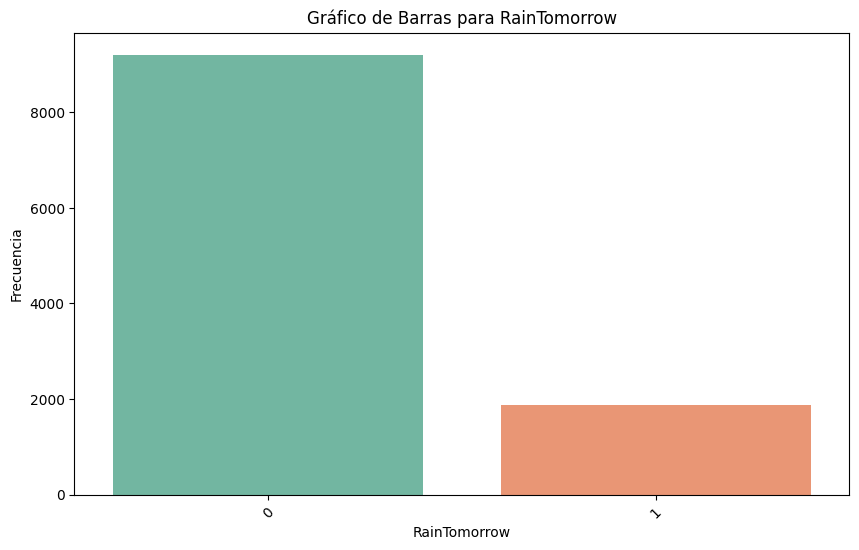

In [174]:
# @title
plt.figure(figsize=(10, 6))  # Ajusta el tamaño del gráfico si es necesario
sns.countplot(data=df_sin_outliers, x='RainTomorrow', palette='Set2')  # Utiliza 'countplot' de Seaborn
plt.title(f'Gráfico de Barras para RainTomorrow')
plt.xlabel("RainTomorrow")
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)  # Rota las etiquetas del eje x si es necesario
plt.show()

In [175]:
# @title
df_sin_outliers.drop(['Location', 'WindDir9am', 'WindDir3pm','WindGustDir','Date'], axis=1, inplace=True)

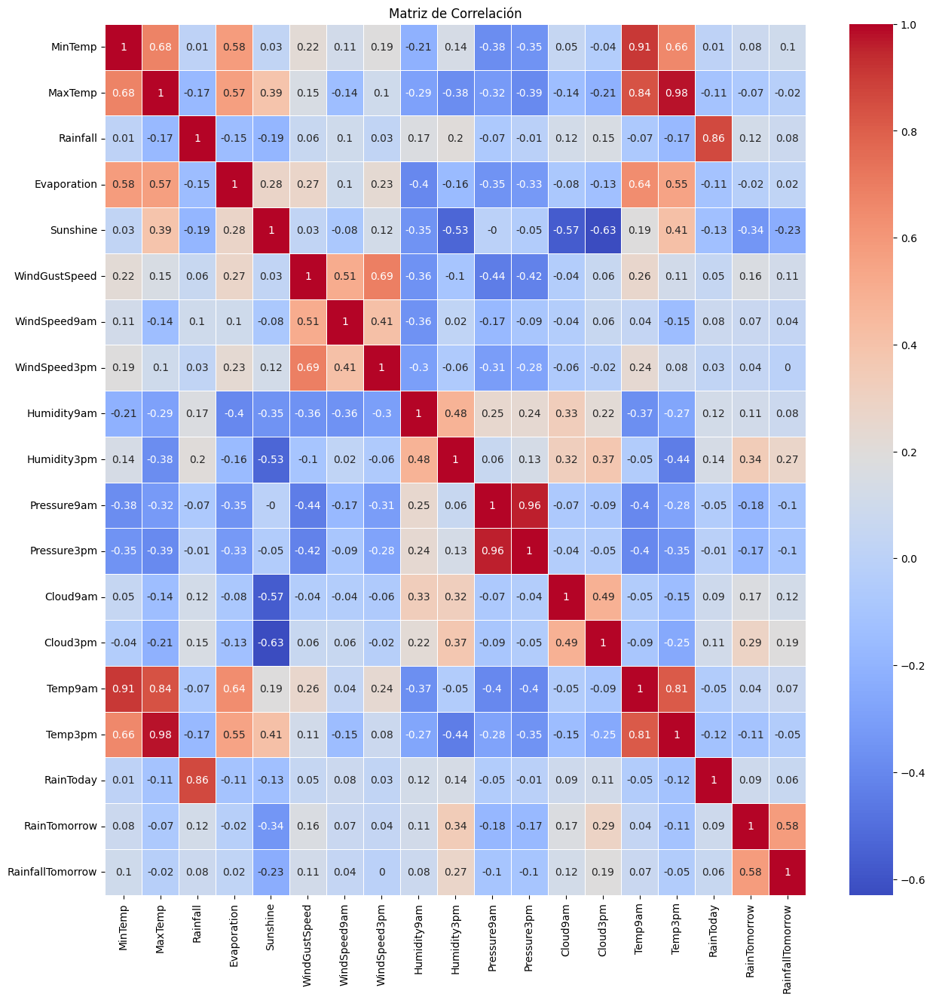

In [176]:
# @title
correlation_matrix3 = df_sin_outliers.corr()

# Redondea los valores de la matriz a dos decimales
correlation_matrix3 = correlation_matrix3.round(2)

# Crea una visualización de la matriz de correlación utilizando Seaborn
plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix3, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Matriz de Correlación')
plt.show()

In [177]:
# @title
# Seleccionar características (variables independientes)
# Aquí, selecciona todas las columnas excepto 'RainTomorrow' y 'RainfallTomorrow'
features = df_sin_outliers.drop(['RainfallTomorrow'] , axis=1)

# Variables objetivo
target_rain_tomorrow = df_sin_outliers['RainTomorrow']
target_rainfall_tomorrow = df_sin_outliers['RainfallTomorrow']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    features, target_rainfall_tomorrow, test_size=0.2, random_state=42)

# Modelo de regresión lineal para 'RainfallTomorrow'
lr_rainfall_tomorrow = LinearRegression()
lr_rainfall_tomorrow.fit(X_train, y_train)
y_pred_rainfall_tomorrow = lr_rainfall_tomorrow.predict(X_test)

# Evaluar el modelo para 'RainfallTomorrow'
r2_rainfall_tomorrow = r2_score(y_test, y_pred_rainfall_tomorrow)
mse_rainfall_tomorrow = mean_squared_error(y_test, y_pred_rainfall_tomorrow)
rmse_rainfall_tomorrow = mean_squared_error(y_test, y_pred_rainfall_tomorrow, squared=False)
mae_rainfall_tomorrow = mean_absolute_error(y_test, y_pred_rainfall_tomorrow)
mape_rainfall_tomorrow = (mae_rainfall_tomorrow / np.mean(y_test)) * 100

# Imprimir métricas para 'RainfallTomorrow'
print("\nMétricas para RainfallTomorrow:")
print("R2 Score:", r2_rainfall_tomorrow)
print("Mean Squared Error:", mse_rainfall_tomorrow)
print("Root Mean Squared Error:", rmse_rainfall_tomorrow)
print("Mean Absolute Error:", mae_rainfall_tomorrow)
print("MAPE:", mape_rainfall_tomorrow)


Métricas para RainfallTomorrow:
R2 Score: 0.31142178648271124
Mean Squared Error: 21.87867083017257
Root Mean Squared Error: 4.677464145257831
Mean Absolute Error: 1.4325724023703124
MAPE: 99.81387969352656


In [178]:
# @title
# Obtener los coeficientes del modelo de regresión lineal
coeficientes = lr_rainfall_tomorrow.coef_

# Obtener el nombre de las características (columnas)
nombres_caracteristicas = X_train.columns

# Crear un diccionario que asocie cada coeficiente con su nombre de característica
coeficientes_por_caracteristica = dict(zip(nombres_caracteristicas, coeficientes))

# Imprimir los coeficientes junto con los nombres de las características
for caracteristica, coeficiente in coeficientes_por_caracteristica.items():
    print(f"{caracteristica}: {coeficiente}")


MinTemp: -0.13570381146675692
MaxTemp: 0.7394257192439944
Rainfall: 0.1846998961047016
Evaporation: 0.1020796658893701
Sunshine: -0.1396929426824293
WindGustSpeed: 0.425921298379976
WindSpeed9am: -0.039930894563125145
WindSpeed3pm: -0.32332525961076714
Humidity9am: -0.0984832908696393
Humidity3pm: 0.5953226782918577
Pressure9am: 0.6517463034749698
Pressure3pm: -0.5315361017433228
Cloud9am: 0.002613849776608175
Cloud3pm: -0.056380876545350844
Temp9am: 0.05717813976062427
Temp3pm: -0.42066023592971113
RainToday: -0.5927388056731175
RainTomorrow: 6.992892250768566


In [179]:
# @title
best_features = ['Humidity3pm','MaxTemp','Evaporation','RainToday','Sunshine','WindGustSpeed']

Los modelos no alcanzaron los niveles de competencia esperados, y el tratamiento de los outliers redujo la eficacia aun mas del modelo.

4. Implementar la solución del problema de clasificación con regresión logística.
● Obtener las métricas adecuadas (entre Accuracy, precision, recall, F1 Score,
ROC-AUC, entre otras).

# Regresion logistica

In [180]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, roc_auc_score, auc
from sklearn.metrics import precision_recall_curve
from sklearn.decomposition import PCA

In [181]:
# Contar la cantidad de 1 (RainTomorrow=1) y 0 (RainTomorrow=0)
conteo_categorias = df_codificado_general['RainTomorrow'].value_counts()
print(conteo_categorias)

proporcion_1 = conteo_categorias[1] / len(df)
proporcion_0 = conteo_categorias[0] / len(df)

# Verificar si el DataFrame está balanceado
if 0.4 <= proporcion_1 <= 0.6:
    print("El DataFrame está balanceado.")
else:
    print("El DataFrame no está balanceado.")


0    11593
1     3443
Name: RainTomorrow, dtype: int64
El DataFrame no está balanceado.


In [182]:
df_codificado_general.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
30167,1.340321,0.098465,1.796290,0.500442,-1.957332,-0.207287,0.068509,-0.178449,1.479725,1.847572,-0.101817,0.183405,1.205800,1.342527,0.918133,0.106310,1,1,0.512355
30168,1.340321,0.626774,0.499759,-0.462822,-1.207533,-0.207287,-0.712687,-0.918982,0.903244,1.227254,-0.060938,0.044628,0.819587,0.928417,1.223366,0.771928,1,1,0.594336
30169,1.697139,0.445168,0.580792,-0.806845,-1.929561,-0.207287,0.068509,-2.082677,1.223511,1.960357,-0.224456,-0.066393,0.819587,1.342527,1.420870,0.464719,1,1,2.261292
30170,1.459260,0.164504,2.228467,-0.875650,-1.957332,-0.207287,0.556757,-0.178449,0.903244,2.185927,-0.565119,-0.593744,1.205800,1.342527,1.043817,0.106310,1,1,10.268147
30171,1.374304,0.643284,10.142711,0.018810,-1.957332,-0.207287,-0.517388,-1.659515,1.223511,1.283646,-1.369084,-1.565180,1.205800,1.342527,1.241321,0.891397,1,1,-0.088842


In [183]:
# Dividir el conjunto de datos en entrenamiento y prueba
X = df_codificado_general.drop(["RainTomorrow","RainfallTomorrow"], axis=1)  # Variables predictoras
y = df_codificado_general["RainTomorrow"]  # Variable objetivo

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
y_testSB = y_test

In [184]:
# Inicializar y entrenar un modelo de regresión logística
modelo_logistico = LogisticRegression(random_state=42)
modelo_logistico.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = modelo_logistico.predict(X_test)


In [185]:
y_pred = modelo_logistico.predict(X_test)

# Calcular la precisión del modelo
precision = accuracy_score(y_test, y_pred)
print("Precisión del modelo:", precision.round(4))

# Calcular la matriz de confusión
matriz_confusion = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(matriz_confusion)

# Generar un informe de clasificación
reporte_clasificacion = classification_report(y_test, y_pred)
print("Informe de Clasificación:")
print(reporte_clasificacion)

Precisión del modelo: 0.8454
Matriz de Confusión:
[[2189  106]
 [ 359  354]]
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.86      0.95      0.90      2295
           1       0.77      0.50      0.60       713

    accuracy                           0.85      3008
   macro avg       0.81      0.73      0.75      3008
weighted avg       0.84      0.85      0.83      3008



    accuracy_score calcula la precisión del modelo.
    precision_score calcula la precisión (TP / (TP + FP)).
    recall_score calcula el recall o la tasa de verdaderos positivos (TP / (TP + FN)).
    f1_score calcula el puntaje F1, que es la media armónica de precisión y recall.
    roc_auc_score calcula el área bajo la curva ROC (ROC-AUC).

In [186]:
# Supongamos que tienes las etiquetas reales y las predicciones
# Calcular Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy.round(4))

# Calcular Precision
precision = precision_score(y_test, y_pred)
print("Precision:", precision.round(4))

# Calcular Recall
recall = recall_score(y_test, y_pred)
print("Recall:", recall.round(4))

# Calcular F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1.round(4))

# Calcular ROC-AUC
roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc.round(4))


Accuracy: 0.8454
Precision: 0.7696
Recall: 0.4965
F1 Score: 0.6036
ROC-AUC: 0.7252


In [187]:
data = pd.DataFrame(columns=['Modelo', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])
data = data.append({'Modelo': "Sin_Balanceo", 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'F1 Score': f1, 'ROC-AUC': roc_auc}, ignore_index=True)
data2 = pd.DataFrame()
data2 = data2.append({'Modelo': "Sin_Balanceo", 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'F1 Score': f1, 'ROC-AUC': roc_auc}, ignore_index=True)

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\3550138142.py:2: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\3550138142.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



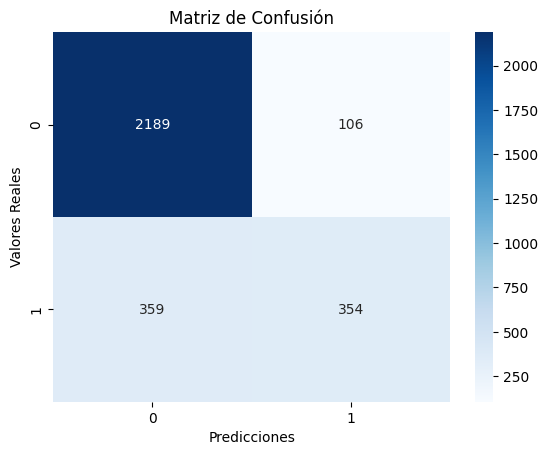

In [188]:
# Obtener la matriz de confusión
confusionSB = confusion_matrix(y_test, y_pred)

# Crear una matriz de confusión visual con Seaborn
sns.heatmap(confusionSB, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicciones")
plt.ylabel("Valores Reales")
plt.title("Matriz de Confusión")
plt.show()

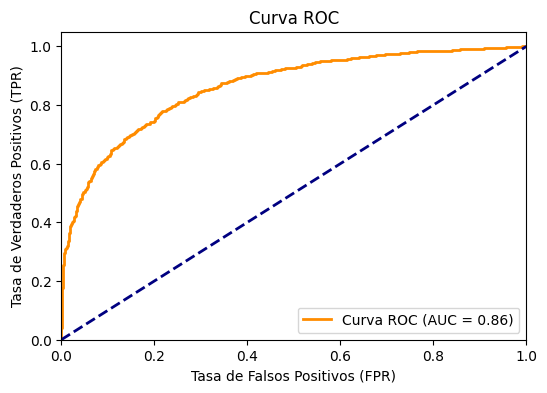

In [189]:
y_probsSB = modelo_logistico.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_probsSB)
roc_auc = auc(fpr, tpr)
# Grafico la curva ROC
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

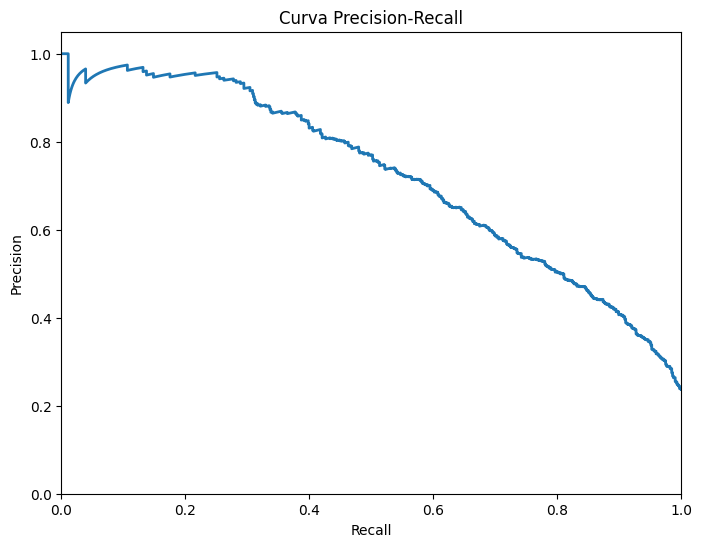

In [190]:
y_probs = modelo_logistico.predict_proba(X_test)[:, 1]
precision, recall, _ = precision_recall_curve(y_test, y_probs)

# Crear la curva Precision-Recall
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, linewidth=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Curva Precision-Recall')
plt.show()


In [191]:
y_pred_proba = modelo_logistico.predict_proba(X_test)

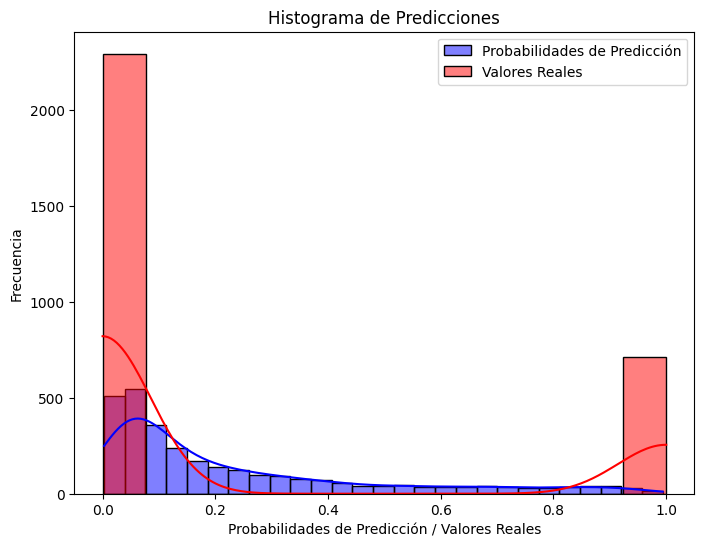

In [192]:

plt.figure(figsize=(8, 6))

# Histograma de probabilidades de predicción
sns.histplot(y_pred_proba[:, 1], kde=True, color="blue", label="Probabilidades de Predicción")

# Histograma de valores reales
sns.histplot(y_test, kde=True, color="red", label="Valores Reales")

plt.title("Histograma de Predicciones")
plt.xlabel("Probabilidades de Predicción / Valores Reales")
plt.ylabel("Frecuencia")
plt.legend()
plt.show()

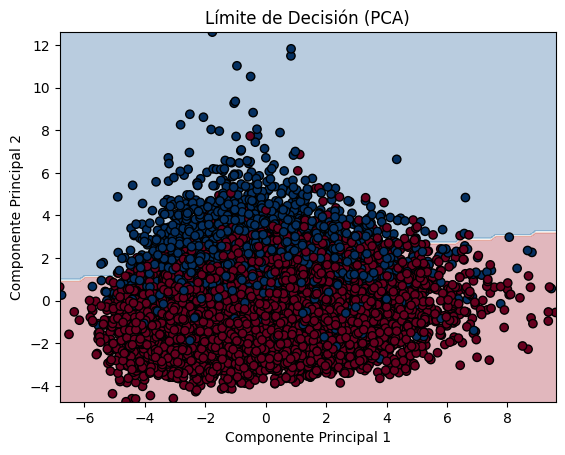

In [193]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression

# Supongamos que tienes un DataFrame 'df' con 18 columnas y etiquetas 'y'
X = df_codificado_general.drop('RainTomorrow', axis=1)
y = df_codificado_general['RainTomorrow']

# Aplica PCA para reducir la dimensionalidad a 2 componentes principales
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X)

# Entrena un modelo de regresión logística en los componentes principales reducidos
modelo_logistico = LogisticRegression()
modelo_logistico.fit(X_reduced, y)

# Crea una malla de puntos en el espacio de 2 dimensiones
xx, yy = np.meshgrid(np.linspace(X_reduced[:, 0].min(), X_reduced[:, 0].max(), 100),
                     np.linspace(X_reduced[:, 1].min(), X_reduced[:, 1].max(), 100))

# Realiza predicciones en cada punto de la malla
Z = modelo_logistico.predict(np.c_[xx.ravel(), yy.ravel()])

# Asigna colores a los puntos según la predicción
Z = Z.reshape(xx.shape)

# Traza el límite de decisión y los puntos de datos reales en el espacio de 2 dimensiones
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.3)
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y, cmap=plt.cm.RdBu, edgecolor='k')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Límite de Decisión (PCA)')
plt.show()

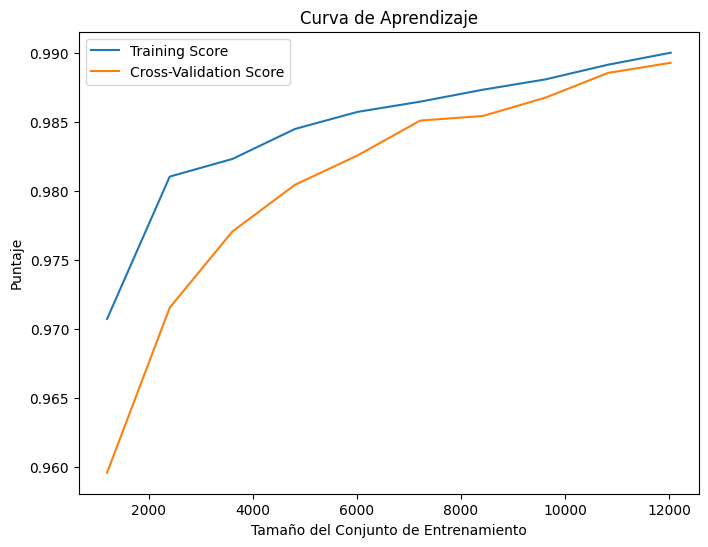

In [194]:
from sklearn.model_selection import learning_curve

# Supongamos que tienes un modelo llamado 'modelo' y datos X e y

train_sizes, train_scores, test_scores = learning_curve(modelo_logistico, X, y, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)

plt.figure(figsize=(8, 6))
plt.plot(train_sizes, np.mean(train_scores, axis=1), label="Training Score")
plt.plot(train_sizes, np.mean(test_scores, axis=1), label="Cross-Validation Score")
plt.title("Curva de Aprendizaje")
plt.xlabel("Tamaño del Conjunto de Entrenamiento")
plt.ylabel("Puntaje")
plt.legend()
plt.show()

Observamos que aunque los valores de precision son buenos a pesar del desbalanceo de datos, la tasa de error del Tipo 2 es aproximadamente de un 50%.
Nos proponemos mejorar este valor, por lo que daremos mas importancia al Recall y toleraremos la baja de precision que ello conlleva.

## Modelo Ingenuo

In [195]:

# Proporción deseada de No llueve (0) y Llueve (1)
proporcion_no_llueve = .75
proporcion_llueve = 0.25


# Dividir el conjunto de datos en entrenamiento y prueba
X = df_codificado_general.drop(["RainTomorrow","RainfallTomorrow"], axis=1)  # Variables predictoras
y = df_codificado_general["RainTomorrow"]  # Variable objetivo


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


np.random.seed(42)
predicciones_ingenuas = np.random.choice([0, 1], size=len(X_test), p=[proporcion_no_llueve, proporcion_llueve])


# Evaluar el rendimiento del modelo ingenuo
accuracy = accuracy_score(y_test, predicciones_ingenuas)
precision = precision_score(y_test, predicciones_ingenuas)
recall = recall_score(y_test, predicciones_ingenuas)
f1 = f1_score(y_test, predicciones_ingenuas)
roc_auc = roc_auc_score(y_test, predicciones_ingenuas)

print("Modelo Ingenuo")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("ROC-AUC:", roc_auc)

Modelo Ingenuo
Accuracy: 0.6100398936170213
Precision: 0.19895287958115182
Recall: 0.2131837307152875
F1 Score: 0.20582261340555177
ROC-AUC: 0.47325853202431045


In [196]:
data2 = data2.append({'Modelo': "Ingenuo", 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'F1 Score': f1, 'ROC-AUC': roc_auc}, ignore_index=True)

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\4153345218.py:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



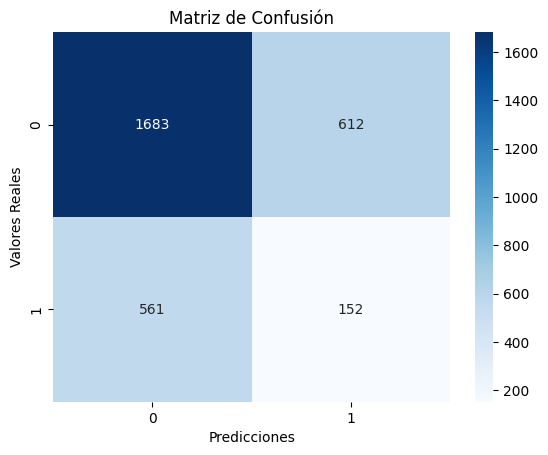

In [197]:
# Obtener la matriz de confusión
confusionIN = confusion_matrix(y_test, predicciones_ingenuas)

# Crear una matriz de confusión visual con Seaborn
sns.heatmap(confusionIN, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicciones")
plt.ylabel("Valores Reales")
plt.title("Matriz de Confusión")
plt.show()

Planteamos un modelo ingenuo, donde pronostica un 75% de los dias como Sin lluvia aleatoriamente como base para comparar metricas.
Pero se observa claramente

In [198]:
import plotly.express as px

# Supongamos que tienes un DataFrame llamado 'df' con tus datos

# Especifica las métricas que deseas graficar
columnas_metricas = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC']

# Reformula el DataFrame para tener una fila por métrica
data_melted2 = data2.melt(id_vars=['Modelo'], value_vars=columnas_metricas, var_name='Métrica', value_name='Valor de la Métrica')

# Redondea los valores a 3 decimales
data_melted2['Valor de la Métrica'] = data_melted2['Valor de la Métrica'].round(3)

# Crear un gráfico de barras agrupadas para cada modelo
fig = px.bar(data_melted2, x='Modelo', y='Valor de la Métrica', color='Métrica',
             title='Gráfico de Barras para Cada Métrica por Modelo',
             labels={'Modelo': 'Modelo', 'Valor de la Métrica': 'Valor de la Métrica', 'Métrica': 'Métrica'},
             barmode='group', text='Valor de la Métrica', height=500)

fig.show()


## Rebalanceo

## Undersampling

In [199]:
from imblearn.under_sampling import RandomUnderSampler
X = df_codificado_general.drop(["RainTomorrow","RainfallTomorrow"], axis=1)  # Variables predictoras
y = df_codificado_general["RainTomorrow"]  # Variable objetivo

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rus = RandomUnderSampler(random_state=42)
X_train_resampled, y_train_resampled = rus.fit_resample(X_train, y_train)
y_testUS=y_test

In [200]:
# Inicializar y entrenar un modelo de regresión logística
modelo_logistico = LogisticRegression(random_state=42)
modelo_logistico.fit(X_train_resampled, y_train_resampled)

# Realizar predicciones en el conjunto de prueba
y_pred = modelo_logistico.predict(X_test)

In [201]:
y_pred = modelo_logistico.predict(X_test)

# Calcular la precisión del modelo
precision = accuracy_score(y_test, y_pred)
print("Precisión del modelo:", precision.round(4))

# Calcular la matriz de confusión
matriz_confusion = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(matriz_confusion)

# Generar un informe de clasificación
reporte_clasificacion = classification_report(y_test, y_pred)
print("Informe de Clasificación:")
print(reporte_clasificacion)

Precisión del modelo: 0.7769
Matriz de Confusión:
[[1795  500]
 [ 171  542]]
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.91      0.78      0.84      2295
           1       0.52      0.76      0.62       713

    accuracy                           0.78      3008
   macro avg       0.72      0.77      0.73      3008
weighted avg       0.82      0.78      0.79      3008



In [202]:
# Calcular Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy.round(4))

# Calcular Precision
precision = precision_score(y_test, y_pred)
print("Precision:", precision.round(4))

# Calcular Recall
recall = recall_score(y_test, y_pred)
print("Recall:", recall.round(4))

# Calcular F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1.round(4))

# Calcular ROC-AUC
roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc.round(4))



Accuracy: 0.7769
Precision: 0.5202
Recall: 0.7602
F1 Score: 0.6177
ROC-AUC: 0.7712


In [203]:
data = data.append({'Modelo': "Undersampling", 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'F1 Score': f1, 'ROC-AUC': roc_auc}, ignore_index=True)

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\2939457788.py:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



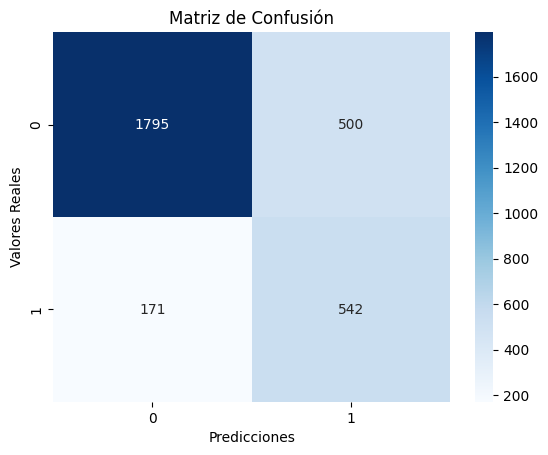

In [204]:
# Obtener la matriz de confusión
confusionUS = confusion_matrix(y_test, y_pred)

# Crear una matriz de confusión visual con Seaborn
sns.heatmap(confusionUS, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicciones")
plt.ylabel("Valores Reales")
plt.title("Matriz de Confusión")
plt.show()

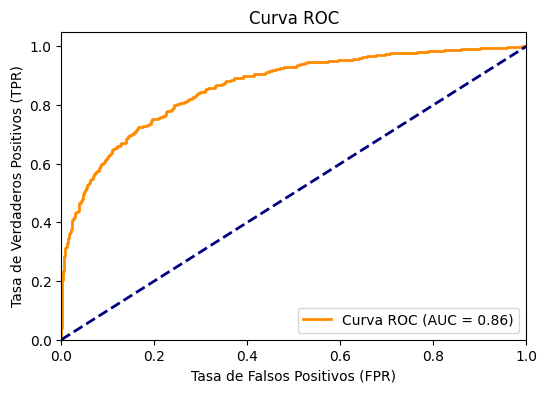

In [205]:
y_probsUS = modelo_logistico.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_probsUS)
roc_auc = auc(fpr, tpr)
# Grafico la curva ROC
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

Oversampling SMOTE

In [206]:
from imblearn.over_sampling import SMOTE
X = df_codificado_general.drop(["RainTomorrow","RainfallTomorrow"], axis=1)  # Variables predictoras
y = df_codificado_general["RainTomorrow"]  # Variable objetivo

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

smote = SMOTE(sampling_strategy='auto', random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)
y_testOS = y_test

In [207]:
# Inicializar y entrenar un modelo de regresión logística
modelo_logistico = LogisticRegression(random_state=42)
modelo_logistico.fit(X_train_resampled, y_train_resampled)

# Realizar predicciones en el conjunto de prueba
y_pred = modelo_logistico.predict(X_test)

In [208]:
y_pred = modelo_logistico.predict(X_test)

# Calcular la precisión del modelo
precision = accuracy_score(y_test, y_pred)
print("Precisión del modelo:", precision.round(4))

# Calcular la matriz de confusión
matriz_confusion = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(matriz_confusion)

# Generar un informe de clasificación
reporte_clasificacion = classification_report(y_test, y_pred)
print("Informe de Clasificación:")
print(reporte_clasificacion)

Precisión del modelo: 0.7789
Matriz de Confusión:
[[1795  500]
 [ 165  548]]
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.92      0.78      0.84      2295
           1       0.52      0.77      0.62       713

    accuracy                           0.78      3008
   macro avg       0.72      0.78      0.73      3008
weighted avg       0.82      0.78      0.79      3008



In [209]:

# Calcular Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy.round(4))

# Calcular Precision
precision = precision_score(y_test, y_pred)
print("Precision:", precision.round(4))

# Calcular Recall
recall = recall_score(y_test, y_pred)
print("Recall:", recall.round(4))

# Calcular F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1.round(4))

# Calcular ROC-AUC
roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc.round(4))

Accuracy: 0.7789
Precision: 0.5229
Recall: 0.7686
F1 Score: 0.6224
ROC-AUC: 0.7754


In [210]:
data = data.append({'Modelo': "Oversampling", 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'F1 Score': f1, 'ROC-AUC': roc_auc}, ignore_index=True)

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\2933568249.py:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



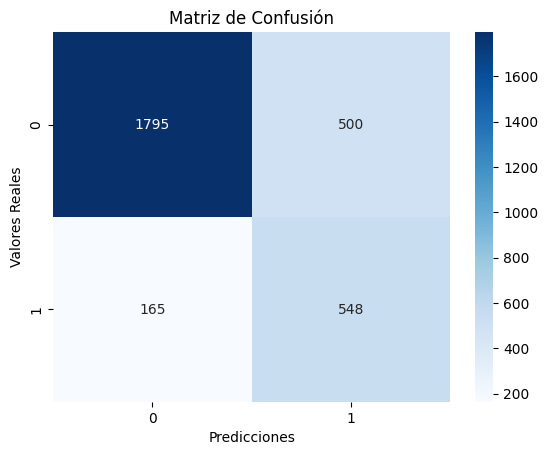

In [211]:
# Obtener la matriz de confusión
confusionOS = confusion_matrix(y_test, y_pred)

# Crear una matriz de confusión visual con Seaborn
sns.heatmap(confusionOS, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicciones")
plt.ylabel("Valores Reales")
plt.title("Matriz de Confusión")
plt.show()

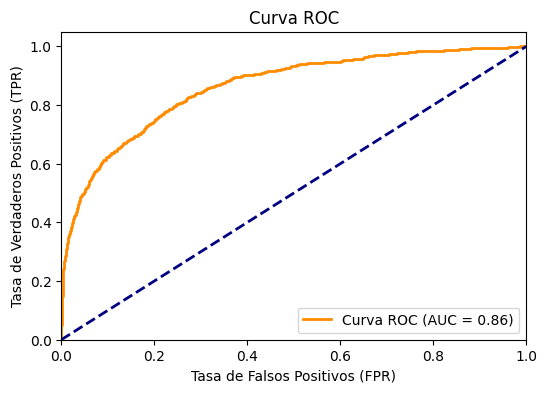

In [212]:
y_probsOS = modelo_logistico.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_probsOS)
roc_auc = auc(fpr, tpr)
# Grafico la curva ROC
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

## Con Regularizacion

In [213]:
from sklearn.linear_model import LogisticRegression

# Crear un modelo de regresión logística con regularización L1 (Lasso)
# Ajusta el valor de 'C' para controlar la fuerza de la regularización (menos es más regularización)
# Un valor más pequeño de 'C' aumentará la regularización
model = LogisticRegression(penalty='l1', C=1, solver='saga', random_state=42)
y_testOSR = y_test

# Entrenar el modelo con tus datos de entrenamiento
model.fit(X_train_resampled, y_train_resampled)

# Realizar predicciones en el conjunto de prueba
y_pred = model.predict(X_test)

In [214]:
y_pred = model.predict(X_test)

# Calcular la precisión del modelo
precision = accuracy_score(y_test, y_pred)
print("Precisión del modelo:", precision.round(4))

# Calcular la matriz de confusión
matriz_confusion = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(matriz_confusion)

# Generar un informe de clasificación
reporte_clasificacion = classification_report(y_test, y_pred)
print("Informe de Clasificación:")
print(reporte_clasificacion)

Precisión del modelo: 0.7793
Matriz de Confusión:
[[1796  499]
 [ 165  548]]
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.92      0.78      0.84      2295
           1       0.52      0.77      0.62       713

    accuracy                           0.78      3008
   macro avg       0.72      0.78      0.73      3008
weighted avg       0.82      0.78      0.79      3008



In [215]:

# Calcular Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy.round(4))

# Calcular Precision
precision = precision_score(y_test, y_pred)
print("Precision:", precision.round(4))

# Calcular Recall
recall = recall_score(y_test, y_pred)
print("Recall:", recall.round(4))

# Calcular F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1.round(4))

# Calcular ROC-AUC
roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc.round(4))

Accuracy: 0.7793
Precision: 0.5234
Recall: 0.7686
F1 Score: 0.6227
ROC-AUC: 0.7756


In [216]:
data = data.append({'Modelo': "Oversampling Reg", 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'F1 Score': f1, 'ROC-AUC': roc_auc}, ignore_index=True)

C:\Users\Nico\AppData\Local\Temp\ipykernel_4160\1014974524.py:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



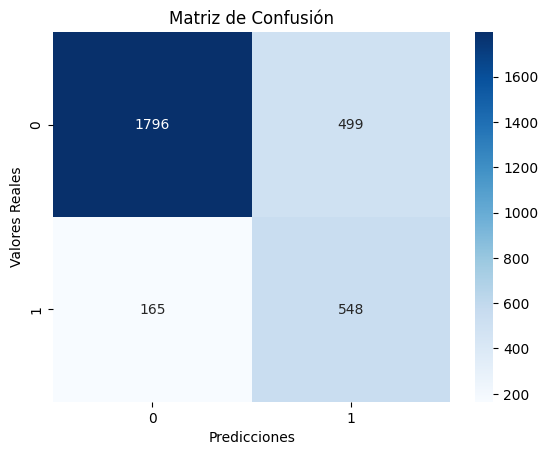

In [217]:

confusionOS = confusion_matrix(y_test, y_pred)

# Crear una matriz de confusión visual con Seaborn
sns.heatmap(confusionOS, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicciones")
plt.ylabel("Valores Reales")
plt.title("Matriz de Confusión")
plt.show()

In [218]:
from sklearn.linear_model import LogisticRegression

# Crear un modelo de regresión logística con regularización L2 (Ridge) y solucionador 'lbfgs'
# Ajusta el valor de 'C' para controlar la fuerza de la regularización (menos es más regularización)
# Un valor más pequeño de 'C' aumentará la regularización
model = LogisticRegression(penalty='l2', C=10, solver='lbfgs', random_state=42)

# Entrenar el modelo con tus datos de entrenamiento
model.fit(X_train_resampled, y_train_resampled)

# Realizar predicciones en el conjunto de prueba
y_pred = model.predict(X_test)

In [219]:
y_pred = model.predict(X_test)

# Calcular la precisión del modelo
precision = accuracy_score(y_test, y_pred)
print("Precisión del modelo:", precision.round(4))

# Calcular la matriz de confusión
matriz_confusion = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(matriz_confusion)

# Generar un informe de clasificación
reporte_clasificacion = classification_report(y_test, y_pred)
print("Informe de Clasificación:")
print(reporte_clasificacion)

Precisión del modelo: 0.7793
Matriz de Confusión:
[[1796  499]
 [ 165  548]]
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.92      0.78      0.84      2295
           1       0.52      0.77      0.62       713

    accuracy                           0.78      3008
   macro avg       0.72      0.78      0.73      3008
weighted avg       0.82      0.78      0.79      3008



In [220]:

# Supongamos que tienes las etiquetas reales y las predicciones
# Calcular Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy.round(4))

# Calcular Precision
precision = precision_score(y_test, y_pred)
print("Precision:", precision.round(4))

# Calcular Recall
recall = recall_score(y_test, y_pred)
print("Recall:", recall.round(4))

# Calcular F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1.round(4))

# Calcular ROC-AUC
roc_auc = roc_auc_score(y_test, y_pred)
print("ROC-AUC:", roc_auc.round(4))

Accuracy: 0.7793
Precision: 0.5234
Recall: 0.7686
F1 Score: 0.6227
ROC-AUC: 0.7756


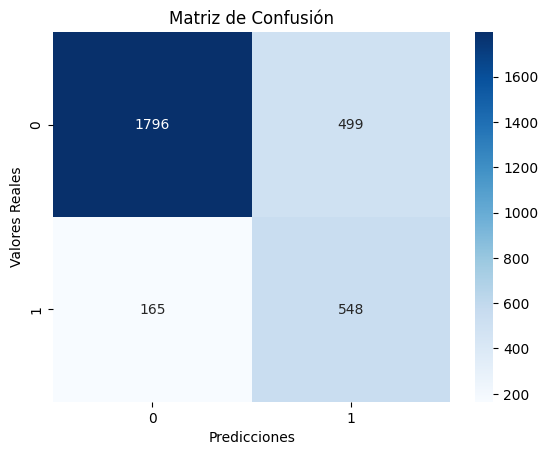

In [221]:
confusionOSR = confusion_matrix(y_test, y_pred)
y_probsOSR = model.predict_proba(X_test)[:, 1]
# Crear una matriz de confusión visual con Seaborn
sns.heatmap(confusionOSR, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicciones")
plt.ylabel("Valores Reales")
plt.title("Matriz de Confusión")
plt.show()

## Comparacion Modelos

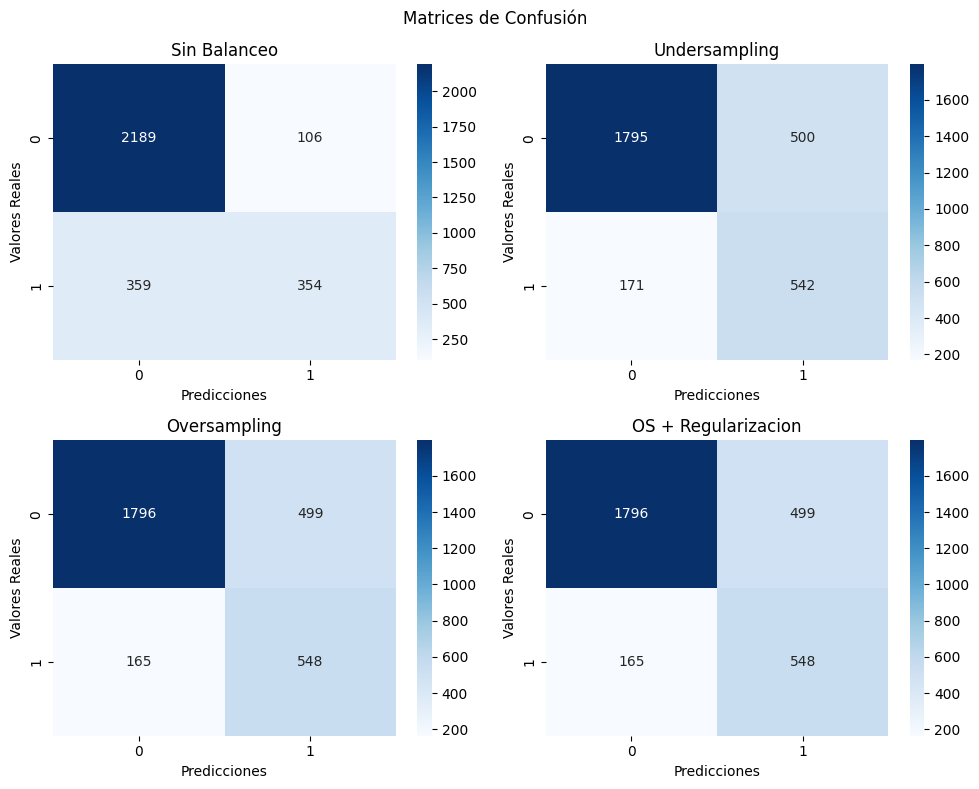

In [222]:
# Crea una figura con cuatro subgráficos
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# Título para toda la figura
fig.suptitle("Matrices de Confusión")

# Títulos para cada subgráfico
titles = ["Sin Balanceo", "Undersampling", "Oversampling", "OS + Regularizacion"]

# Matrices de confusión
matrices = [confusionSB, confusionUS, confusionOS, confusionOSR]

for i, ax in enumerate(axes.ravel()):
    sns.heatmap(matrices[i], annot=True, fmt="d", cmap="Blues", ax=ax)
    ax.set_xlabel("Predicciones")
    ax.set_ylabel("Valores Reales")
    ax.set_title(titles[i])

# Ajusta la disposición de los subgráficos
plt.tight_layout()
plt.show()

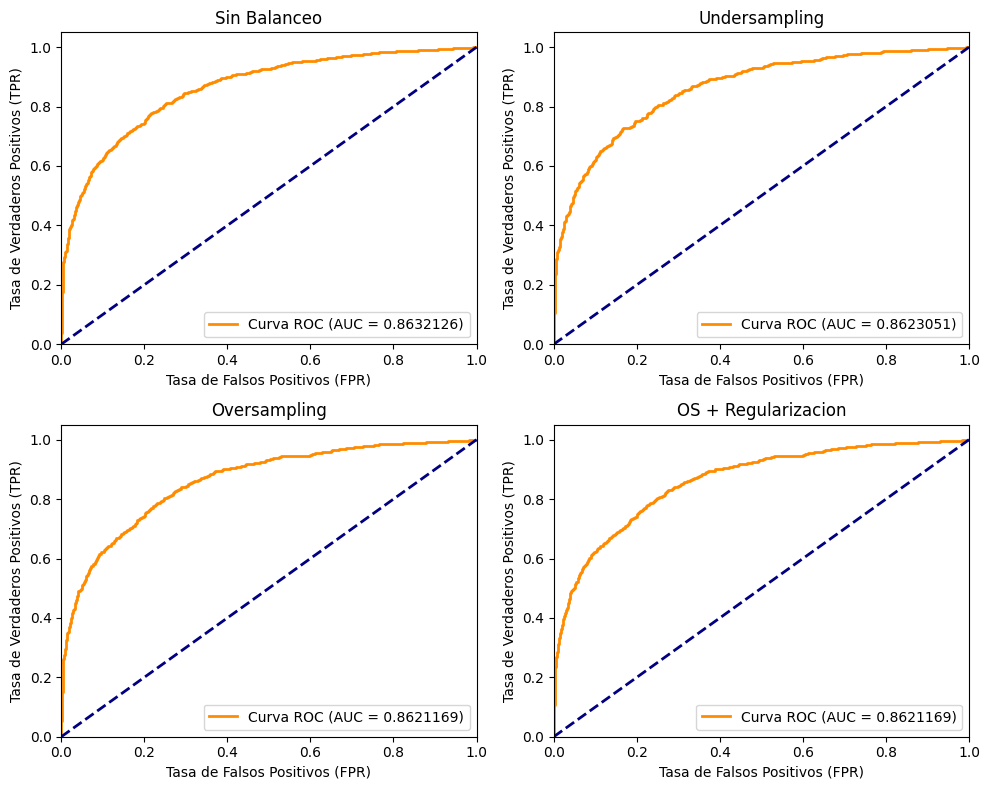

In [223]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Crear una figura con cuatro subgráficos
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# Títulos para cada subgráfico
titles = ["Sin Balanceo", "Undersampling", "Oversampling", "OS + Regularizacion"]

# Probabilidades y etiquetas de prueba para cada modelo
y_probs_modelos = [y_probsSB, y_probsUS, y_probsOS, y_probsOSR]
y_test_modelos = [y_testSB, y_testUS, y_testOS, y_testOSR]

for i, ax in enumerate(axes.ravel()):
    fpr, tpr, thresholds = roc_curve(y_test_modelos[i], y_probs_modelos[i])
    roc_auc = auc(fpr, tpr)

    ax.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (AUC = %0.7f)' % roc_auc)
    ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('Tasa de Falsos Positivos (FPR)')
    ax.set_ylabel('Tasa de Verdaderos Positivos (TPR)')
    ax.set_title(titles[i])
    ax.legend(loc="lower right")

# Ajusta la disposición de los subgráficos
plt.tight_layout()
plt.show()

In [224]:
data.head()

,Modelo,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,Sin_Balanceo,0.845412,0.769565,0.496494,0.603581,0.725153
1,Undersampling,0.776928,0.520154,0.760168,0.617664,0.771152
2,Oversampling,0.778923,0.522901,0.768583,0.622374,0.775359
3,Oversampling Reg,0.779255,0.523400,0.768583,0.622727,0.775577


In [225]:
import plotly.express as px

# Supongamos que tienes un DataFrame llamado 'df' con tus datos

# Especifica las métricas que deseas graficar
columnas_metricas = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC']

# Reformula el DataFrame para tener una fila por métrica
data_melted = data.melt(id_vars=['Modelo'], value_vars=columnas_metricas, var_name='Métrica', value_name='Valor de la Métrica')

# Redondea los valores a 3 decimales
data_melted['Valor de la Métrica'] = data_melted['Valor de la Métrica'].round(3)

# Crear un gráfico de barras agrupadas para cada modelo
fig = px.bar(data_melted, x='Modelo', y='Valor de la Métrica', color='Métrica',
             title='Gráfico de Barras para Cada Métrica por Modelo',
             labels={'Modelo': 'Modelo', 'Valor de la Métrica': 'Valor de la Métrica', 'Métrica': 'Métrica'},
             barmode='group', text='Valor de la Métrica', height=500)

fig.show()


# Conclusiones

Mediante la aplicacion de tecnicas de balanceo de datos conseguimos mejorar las metricas que consideramos mas importantes que eran las relacionadas a la disminucion del Error del Tipo 2. En ese sentido observamos que con cualquier tipo de balanceo se mejora esa metrica considerablemente a costa de Precision y Accuracy principalmente.